# Эксперименты для статьи

### Импорт модулей

In [1]:
import torch
from torch import nn
from torch.fx import symbolic_trace
import torch.utils.data
from torch.utils.data import TensorDataset, DataLoader, Subset, random_split
import torchvision
from torchvision import transforms
import torch.fx as fx
from torchvision.models import resnet50

import numpy as np
from scipy.stats import spearmanr, kendalltau
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import mean_squared_error as mse
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

import abc
from typing import Any, Callable, Dict, List, Optional, Tuple, Set
from functools import reduce, partial
import re
import copy
import collections
from collections import defaultdict
from __future__ import annotations
import json
import os
from datetime import datetime

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm.notebook import tqdm, trange
import networkx as nx

sns.set_style('darkgrid')

### Реализации модулей и функций

Функция для логгирования.

In [12]:
def update_log(idx, filename):
    timestamp = str(datetime.now())
    filepath = f'logs/{filename}.log'

    with open(filepath, 'w') as f:
        f.write(f'{timestamp}\t{idx+1}\t{filename}\n')

Напишем класс для графового представления изначальной модели. Она состоит из модулей-нод и вершин между ними. Также `forward` поддерживает маску для рёбер.

Дополнительно напишем классы-обёртки двух нод для удобства реализации.

In [43]:
class LinearBlock(nn.Module):
    """
    Node for linear with activation.
    """

    def __init__(self, in_features, out_features, activation=nn.ReLU, is_end=True):
        super().__init__()
        self.out_features = out_features
        self.is_end = is_end
        self.linear = nn.Linear(in_features, out_features)
        self.act = activation()

    def forward(self, x):
        return self.act(self.linear(x))

class ConvBlock(nn.Module):
    """
    Node for convolution with activation.
    """

    def __init__(self, in_channels, out_channels, kernel_size=3, activation=nn.ReLU, is_end=True):
        super().__init__()
        self.out_features = out_channels
        self.is_end = is_end

        self.conv = nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size=kernel_size,
            padding=kernel_size // 2
        )

        self.act = activation()

    def forward(self, x):
        return self.act(self.conv(x))

class FlattenBlock(nn.Module):
    def __init__(self, in_channels, spatial, is_end=False):
        super().__init__()
        self.out_features = in_channels * spatial * spatial
        self.is_end = is_end

    def forward(self, x):
        return torch.flatten(x, 1)

class IdBlock(nn.Module):
    """
    Node for identical function. Used for input.
    """

    def __init__(self, input_dim, is_end=False):
        super().__init__()
        self.is_end = is_end
        self.out_features = input_dim

    def forward(self, x):
        # return x
        return torch.flatten(x, 1)

class RandomGraphModel(nn.Module):
    def __init__(self, modules, edges, collect_stats=True):
        super().__init__()
        self.layers = nn.ModuleList(modules)
        self.edges = edges  # list (i, j)
        self.collect_stats = collect_stats

        if collect_stats:
            self.register_buffer(
                "edge_l1_norms",
                torch.zeros(len(edges))
            )

            self.edge_gates = nn.Parameter(
                torch.ones(len(edges)),
                requires_grad=True
            )

            self.register_buffer(
                "edge_molchanov_importance",
                torch.zeros(len(edges))
            )
    
    def reset_edge_stats(self):
        if self.collect_stats:
            self.edge_l1_norms.zero_()
            self.edge_molchanov_importance.zero_()
    
    def accumulate_importance(self):
        """
        After backward()
        """
        if not self.collect_stats:
            return
        
        with torch.no_grad():
            if self.edge_gates.grad is None:
                return

            g = self.edge_gates.grad

            # Taylor FO importance
            importance = (g * self.edge_gates) ** 2

            self.edge_molchanov_importance += importance

            # Delete gradients
            self.edge_gates.grad.zero_()

    def forward(self, x, edge_mask):
        """
        x: input tensor
        edge_mask: Tensor [num_edges]
        """
        node_outputs = {}

        node_outputs[-1] = x

        for k, (i, j) in enumerate(self.edges):
            if i not in node_outputs:
                continue
            
            out = self.layers[j](node_outputs[i])

            if self.collect_stats:
                # Calculating norm
                norm = out.detach().abs().mean()
                self.edge_l1_norms[k] += norm

                # Applying gate for Molchanov
                out = out * self.edge_gates[k]

            out = out * edge_mask[k]

            if j in node_outputs:
                node_outputs[j] = node_outputs[j] + out
            else:
                node_outputs[j] = out

        return node_outputs[max(node_outputs.keys())]

Теперь напишем функцию семплирования нейросетей-графов, используя идею [статьи по NAS](https://arxiv.org/pdf/1707.07012). Решаем задачу классификации MNIST.

In [ ]:
def generate_graph(input_dim, n_iterations):
    """
    Generate NN for MNIST classification. 
    Returns lists with modules and edges between them.
    """

    # Init lists
    modules = [IdBlock(input_dim), LinearBlock(input_dim, 400)]
    edges = [(-1, 0), (0, 1)]

    # Iteration loop of generation
    tbar = trange(n_iterations, desc='Generating graph', leave=False)
    for i in tbar:
        update_log(i, 'generate_graph')
        
        # Choosing parent modeules
        parent1, parent2 = np.random.randint(len(modules), size=2)

        # Random dimention for new modules
        out_dim_new_block = 2 ** np.random.randint(3, 9)

        # Creating the first module
        out_dim_1 = modules[parent1].out_features
        new_block_1 = LinearBlock(out_dim_1, out_dim_new_block, is_end=False)
        edges.append((parent1, len(modules)))
        modules.append(new_block_1)
        modules[parent1].is_end = False

        # Creating the second module
        out_dim_2 = modules[parent2].out_features
        new_block_2 = LinearBlock(out_dim_2, out_dim_new_block, is_end=False)
        edges.append((parent2, len(modules)))
        modules.append(new_block_2)
        modules[parent2].is_end = False

        # Choosing and creating aggregating module
        out_dim_sum_block = 2 ** np.random.randint(3, 9)
        sum_block = LinearBlock(out_dim_new_block, out_dim_sum_block)
        edges.extend([
            (len(modules)-1, len(modules)),
            (len(modules)-2, len(modules))
            ])
        modules.append(sum_block)
    
    # After generation, there are a lot of dangling vertices - let's fix this.

    # Reduce such vertices to a single dimension for subsequent aggregation
    end_idxs = []
    for i, module in enumerate(modules):
        if module.is_end:
            end_block = LinearBlock(module.out_features, 20, is_end=False)
            end_idxs.append(len(modules))
            edges.append((i, len(modules)))
            modules.append(end_block)
            module.is_end = False
    
    # Creating the final classifier
    classifier = nn.Linear(20, 10)
    edges.extend([
        (end_idx, len(modules)) for end_idx in end_idxs
        ])
    modules.append(classifier)

    return modules, edges


def generate_conv_graph(n_iterations):

    modules = [IdBlock(1), ConvBlock(1, 32)]

    edges = [(-1, 0), (0, 1)]

    for i in trange(n_iterations, desc="Generating conv graph", leave=False):
        update_log(i, 'generate_conv_graph')

        parent1, parent2 = np.random.randint(len(modules), size=2)

        out_channels = 2 ** np.random.randint(3, 6)

        # first conv
        in_ch = modules[parent1].out_features
        block1 = ConvBlock(in_ch, out_channels, is_end=False)

        edges.append((parent1, len(modules)))
        modules.append(block1)
        modules[parent1].is_end = False

        # second conv
        in_ch = modules[parent2].out_features
        block2 = ConvBlock(in_ch, out_channels, is_end=False)

        edges.append((parent2, len(modules)))
        modules.append(block2)
        modules[parent2].is_end = False

        # aggregation conv
        out_ch = 2 ** np.random.randint(3, 6)
        sum_block = ConvBlock(out_channels, out_ch)

        edges.extend([
            (len(modules)-1, len(modules)),
            (len(modules)-2, len(modules))
        ])

        modules.append(sum_block)
    
    end_idxs = []
    for i, module in enumerate(modules):
        if module.is_end:
            preend_block = FlattenBlock(module.out_features, 28, is_end=False)
            end_block = LinearBlock(preend_block.out_features, 20, is_end=False)
            end_idxs.append(len(modules)+1)
            edges.append((i, len(modules)))
            edges.append((len(modules), len(modules)+1))
            modules.append(preend_block)
            modules.append(end_block)
            module.is_end = False
    
    # Creating the final classifier
    classifier = nn.Linear(20, 10)
    edges.extend([
        (end_idx, len(modules)) for end_idx in end_idxs
        ])
    modules.append(classifier)

    return modules, edges

Напишем функции для обучения модели.

In [56]:
def get_data(batch_size=64):
    """
    Create train and test MNIST loaders.
    """

    transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    train_dataset = torchvision.datasets.MNIST(
        root="./data",
        train=True,
        download=True,
        transform=transform
    )
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=8, pin_memory=True)

    test_dataset = torchvision.datasets.MNIST(
        root="./data",
        train=False,
        download=True,
        transform=transform
    )
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=8, pin_memory=True)

    return train_loader, test_loader


def train(model, train_loader, criterion, optimizer, device, n_epochs, tqdm_desc, is_surrogate=False):
    """
    Train model. Returns epoch loss history.
    """

    model.train()
    model.to(device)
    losses_history = []
    pbar = trange(n_epochs, desc=tqdm_desc, leave=False)

    if not is_surrogate:
        edge_mask = torch.ones(len(model.edges), device=device)

    for i in pbar:
        update_log(i, 'train')
        
        total_loss = 0.0
        total = 0

        for x, y in train_loader:
            x, y = x.to(device), y.to(device)

            if not is_surrogate:
                logits = model(x, edge_mask)
            else:
                logits = model(x)
            
            loss = criterion(logits, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total += y.size(0)

        epoch_loss = total_loss / total
        losses_history.append(epoch_loss)
        pbar.set_description_str(f'{tqdm_desc}, loss={epoch_loss:.5f}')
    
    return losses_history

Теперь напишем функцию сбора датасета для суррогатной модели.

In [50]:
def create_surrogate_dataset(graph_model, test_loader, criterion, n_iterations, mask_prob, device):
    """
    Create a dataset for surrogate model. Returns train and test Torch datasets.
    """

    graph_model.eval()

    n_edges = len(graph_model.edges)
    masks_train = [torch.ones(n_edges), torch.zeros(n_edges)]
    losses_train = []
    masks_set = set([0, 2**n_edges-1])

    for edge_mask in masks_train:
        loss_mask = 0
        total = 0
        
        with torch.no_grad():
            for x, y in test_loader:
                x, y = x.to(device), y.to(device)
                logits = graph_model(x, edge_mask)
                loss = criterion(logits, y)
                loss_mask += loss.item()
                total += y.size(0)
        losses_train.append(loss_mask / total)
    
    # Iterate masks and calculate loss
    tbar = trange(n_edges, desc='Train masks', leave=False)
    for zero_idx in tbar:
        update_log(zero_idx, 'create_surrogate_dataset_train')

        edge_mask = torch.ones(n_edges)
        edge_mask[zero_idx] = 0
        
        edge_mask_int = int(''.join(map(lambda x: str(x.int().item()), edge_mask)), 2)
        masks_set.add(edge_mask_int)
        
        loss_mask = 0
        total = 0

        with torch.no_grad():
            for x, y in test_loader:
                x, y = x.to(device), y.to(device)
                logits = graph_model(x, edge_mask)
                loss = criterion(logits, y)
                loss_mask += loss.item()
                total += y.size(0)

        masks_train.append(edge_mask)
        losses_train.append(loss_mask / total)
    
    # Normalize losses to [0, 1] and invert
    losses_train =  torch.tensor(losses_train)
    losses_train = (losses_train - losses_train.min()) / (1e-10 + losses_train.max() - losses_train.min())
    losses_train = 1 - losses_train

    masks_test = []
    losses_test = []
    
    # Sampling masks and calculate loss
    tbar = trange(n_iterations, desc='Test masks', leave=False)
    for i in tbar:
        update_log(i, 'create_surrogate_dataset_test')
        
        edge_mask_int = -1
        while edge_mask_int in masks_set:
            edge_mask = (torch.rand((n_edges,)) >= mask_prob).float()
            edge_mask_int = int(''.join(map(lambda x: str(x.int().item()), edge_mask)), 2)
        masks_set.add(edge_mask_int)
        
        loss_mask = 0
        total = 0

        with torch.no_grad():
            for x, y in test_loader:
                x, y = x.to(device), y.to(device)
                logits = graph_model(x, edge_mask)
                loss = criterion(logits, y)
                loss_mask += loss.item()
                total += y.size(0)

        masks_test.append(edge_mask)
        losses_test.append(loss_mask / total)
    
    # Normalize losses to [0, 1] and invert
    losses_test =  torch.tensor(losses_test)
    losses_test = (losses_test - losses_test.min()) / (1e-10 + losses_test.max() - losses_test.min())
    losses_test = 1 - losses_test

    # Сreating datasets
    dataset_train = TensorDataset(torch.vstack(masks_train), losses_train)
    dataset_test = TensorDataset(torch.vstack(masks_test), losses_test)
    
    return dataset_train, dataset_test

Класс суррогатной модели. Версия с нормализацией по рёбрам из одной вершины.

In [17]:
class SurrogateModel(nn.Module):
    def __init__(self, edges: List[Tuple[int, int]]):
        super().__init__()

        self.edges = edges
        self.num_edges = len(edges)

        # Edge weights
        self.gamma = nn.Parameter(torch.zeros(self.num_edges))

        # self.bias = nn.Parameter(torch.tensor(0.0))

        # Incoming and outgoing edges for each vertex
        incoming = defaultdict(list)
        outgoing = defaultdict(list)
        for idx, (u, v) in enumerate(edges):
            incoming[v].append(idx)
            outgoing[u].append(idx)
        self.incoming = dict(incoming)
        self.outgoing = dict(outgoing)

        # All vertices
        vertices = set()
        for u, v in edges:
            vertices.add(u)
            vertices.add(v)
        self.vertices = sorted(vertices)

        # Out vertex
        self.output_vertex = max(v for v in vertices if v >= 0)
    
    def normalized_edge_weights(self) -> torch.Tensor:
        """
        Returns: Tensor [E], >0 and sum of outgoing edges per vertex == 1
        """
        weights = torch.zeros_like(self.gamma)

        for _, edge_indices in self.outgoing.items():
            logits = self.gamma[edge_indices]
            weights[edge_indices] = torch.softmax(logits, dim=0)

        return weights

    def forward(self, edge_mask: torch.Tensor) -> torch.Tensor:
        """
        edge_mask: Tensor [B, num_edges], values in [0, 1]
        return: Tensor [B]
        """
        assert edge_mask.ndim == 2
        assert edge_mask.shape[1] == self.num_edges

        B = edge_mask.shape[0]
        device = edge_mask.device

        # Normalized edge weights
        edge_weights = self.normalized_edge_weights()  # [E]

        # Values in vertices: vertex -> Tensor [B]
        values = {}

        # Fixed input
        values[-1] = torch.ones(B, device=device)

        # Topological pass
        for v in self.vertices:
            if v == -1:
                continue

            incoming_edges = self.incoming.get(v, [])
            if not incoming_edges:
                values[v] = torch.zeros(B, device=device)
                continue

            total = torch.zeros(B, device=device)
            for e_idx in incoming_edges:
                u, _ = self.edges[e_idx]
                total = total + (
                    edge_mask[:, e_idx]
                    * edge_weights[e_idx]
                    * values[u]
                )

            values[v] = total

        # Out in [0, 1]
        output = values[self.output_vertex] # + self.bias
        return output

In [96]:
class SurrogateModel(nn.Module):
    def __init__(self, edges: List[Tuple[int, int]]):
        super().__init__()

        self.edges = edges
        self.num_edges = len(edges)

        # Edge weights
        self.gamma = nn.Parameter(torch.zeros(self.num_edges))

        # Индексы: 0 - линейный (1-й порядок), 1 - квадратичный (самовоздействие), 2 - перекрестный (интерференция)
        self.poly_weights = nn.Parameter(torch.ones(3))
        # -----------------------------------------------------------------

        # Incoming and outgoing edges for each vertex
        incoming = defaultdict(list)
        outgoing = defaultdict(list)
        for idx, (u, v) in enumerate(edges):
            incoming[v].append(idx)
            outgoing[u].append(idx)
        self.incoming = dict(incoming)
        self.outgoing = dict(outgoing)

        # All vertices
        vertices = set()
        for u, v in edges:
            vertices.add(u)
            vertices.add(v)
        self.vertices = sorted(vertices)

        # Out vertex
        self.output_vertex = max(v for v in vertices if v >= 0)
    
    def normalized_edge_weights(self) -> torch.Tensor:
        """
        Returns: Tensor [E], >0 and sum of outgoing edges per vertex == 1
        """
        weights = torch.zeros_like(self.gamma)

        for _, edge_indices in self.outgoing.items():
            logits = self.gamma[edge_indices]
            weights[edge_indices] = torch.softmax(logits, dim=0)

        return weights

    def forward(self, edge_mask: torch.Tensor) -> torch.Tensor:
        """
        edge_mask: Tensor [B, num_edges], values in [0, 1]
        return: Tensor [B]
        """
        assert edge_mask.ndim == 2
        assert edge_mask.shape[1] == self.num_edges

        B = edge_mask.shape[0]
        device = edge_mask.device

        # Normalized edge weights
        edge_weights = self.normalized_edge_weights()  # [E]

        # values_1st: классическое прохождение сигнала
        # values_sq: прохождение квадратов сигнала (дисперсия путей)
        values_1st = {}
        values_sq = {}

        # Fixed input
        values_1st[-1] = torch.ones(B, device=device)
        values_sq[-1] = torch.ones(B, device=device)
        # ----------------------------------------------------------

        # Topological pass
        for v in self.vertices:
            if v == -1:
                continue

            incoming_edges = self.incoming.get(v, [])
            if not incoming_edges:
                values_1st[v] = torch.zeros(B, device=device)
                values_sq[v] = torch.zeros(B, device=device)
                continue

            total_1st = torch.zeros(B, device=device)
            total_sq = torch.zeros(B, device=device)

            for e_idx in incoming_edges:
                u, _ = self.edges[e_idx]
                
                # Совместное значение маски и веса ребра
                edge_val = edge_mask[:, e_idx] * edge_weights[e_idx]

                total_1st = total_1st + (edge_val * values_1st[u])
                total_sq = total_sq + ((edge_val ** 2) * values_sq[u])
                # -----------------------------------------------

            values_1st[v] = total_1st
            values_sq[v] = total_sq

        out_1st = values_1st[self.output_vertex]
        out_sq = values_sq[self.output_vertex]

        # Вычисляем перекрестные члены (коадаптацию параллельных веток)
        out_cross = (out_1st ** 2) - out_sq

        # Взвешиваем все три смысловых компонента
        w_lin, w_sq, w_cross = self.poly_weights
        output = (w_lin * out_1st) + (w_sq * out_sq) + (w_cross * out_cross)
        # -------------------------------------------------------------

        return output

Ещё напишем функцию для составления baseline (FCN).

In [19]:
def create_surrogate_fcn_model(n_edges, fcn_dims, add_sigmoid=False):
    """
    Create a surrogate FCN baseline. Returns nn.Module.
    """
    
    layers = [nn.Linear(n_edges, fcn_dims[0]), nn.ReLU()]

    for i in range(1, len(fcn_dims)):
        layers.append(nn.Linear(fcn_dims[i-1], fcn_dims[i]))
        layers.append(nn.ReLU())
    
    layers.append(nn.Linear(fcn_dims[-1], 1))
    if add_sigmoid:
        layers.append(nn.Sigmoid())
    
    return nn.Sequential(*layers)

Функция для тестирования моделей.

In [20]:
def test_models(name2model, dataset_test, device):
    """
    Caclulate RMSE for surrogate model. Returns dicts: model_name -> metric, model_name -> preds
    """
    name2preds = defaultdict(list)
    y_true = defaultdict(list)

    for name_model, model in name2model.items():
        if isinstance(model,
                      sklearn.linear_model._base.LinearRegression):
            preds = model.predict(dataset_test.tensors[0].numpy())
            name2preds[name_model] = preds
        
        elif isinstance(model, torch.Tensor):
            for x, _ in dataset_test:
                x = x.to(device).bool()
                pred = model[x].mean()
                name2preds[name_model].append(pred.item())

        else:
            with torch.no_grad():
                model.eval()
                model.to(device)
                for x, _ in dataset_test:
                    x = x.to(device)
                    pred = model(x.unsqueeze(0))
                    name2preds[name_model].append(pred.item())

    name2metric = dict()
    y_true = dataset_test.tensors[1]
    for name_model, preds in name2preds.items():
        name2metric[name_model] = np.sqrt(mse(y_true, preds)) * 100

    return name2metric, name2preds, y_true

Ещё напишем функцию для сбора статистик для L1 и Molchanov.

In [21]:
def collect_model_stats(graph_model, test_loader, criterion, optimizer, device):
    """
    Collect stats for L1- and Molchanov pruning. Returns dict with edge importances.
    """

    graph_model.eval()
    graph_model.reset_edge_stats()

    edge_mask = torch.ones(len(graph_model.edges), device=device)

    for x, y in test_loader:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        logits = graph_model(x, edge_mask)
        loss = criterion(logits, y)
        loss.backward()

        graph_model.accumulate_importance()
    
    return {
        'l1': graph_model.edge_l1_norms,
        'molchanov': graph_model.edge_molchanov_importance
    }

### Эксперимент

Зададим конфиг эксперимента.

In [51]:
config = {
    'n_iterations_global': 10,  # iterations for all experiment
    
    'input_dim': 28*28,  # MNIST dim
    'n_iterations_graph': 2,  # iterations for sampling graph
    'n_iterations_masks': 500,  # iterations for sampling masks
    'mask_prob': 0.5,  # probability of turning off an edge while sampling masks

    'batch_size_mnist': 256,  # batch size for MNIST dataset
    'batch_size_surrogate': 32,  # batch size for masks dataset

    'n_epochs_mnist': 100,  # number epochs for the main model
    'n_epochs_surrogate': 3_000,  # number epochs for surrogate graph model
    'n_epochs_fcn': 1_000,  # number epochs for surrogate FCN model
    'fcn_dims': [10],  # hidden dims for surrogate FCN model

    'lr_mnist': 1e-3,  # learning rate for the main model
    'lr_surrogate': 1e-3,  # learning rate for the surrogate graph model
    'lr_fcn': 1e-3,  # learning rate for the surrogate FCN model
    
    'device': "cuda" if torch.cuda.is_available() else "cpu"  # device for training and testing
}

Загрузим данные для эксперимента.

In [58]:
train_loader, test_loader = get_data(config['batch_size_mnist'])

#### 10-15 рёбер

In [59]:
config['n_iterations_graph'] = 2

modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
len(edges)

Generating graph:   0%|          | 0/2 [00:00<?, ?it/s]

16

In [60]:
config['n_iterations_global'] = 1

In [61]:
mnist_losses_history = []
surrogate_losses_history = []
fcn_losses_history = []
metric_results = defaultdict(list)
preds_results = defaultdict(list)
y_true_all = []

tbar = trange(config['n_iterations_global'], desc='Global iteration')
for i in tbar:
    update_log(i, 'global')
    
    # Sampling and creating graph model
    modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
    model = RandomGraphModel(modules, edges)

    # Training model
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=config['lr_mnist'])
    mnist_losses_history.append(train(model, train_loader, criterion, optimizer,
        config['device'], config['n_epochs_mnist'],
        'MNIST training', is_surrogate=False))

    # Creating a dataset for surrogate model
    surrogate_dataset_train, surrogate_dataset_test = create_surrogate_dataset(
        model, test_loader, nn.CrossEntropyLoss(),
        config['n_iterations_masks'], config['mask_prob'], config['device'])
    surrogate_train_loader = DataLoader(surrogate_dataset_train,
                                        batch_size=config['batch_size_surrogate'], shuffle=True)
    
    # Calculating L1 and Molchanov importances
    importance_stats = collect_model_stats(model, test_loader, criterion, optimizer, config['device'])

    # Creating and train surrogate graph model
    surrogate_graph_model = SurrogateModel(edges)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_graph_model.parameters(), lr=config['lr_surrogate'])
    surrogate_losses_history.append(train(surrogate_graph_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_surrogate'], 'Surrogate graph training', is_surrogate=True))

    # Creating and training surrogate FCN model (TODO: mismatch loss dim)
    surrogate_fcn_model = create_surrogate_fcn_model(len(edges), config['fcn_dims'], add_sigmoid=False)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_fcn_model.parameters(), lr=config['lr_fcn'])
    fcn_losses_history.append(train(surrogate_fcn_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_fcn'], 'Surrogate FCN training', is_surrogate=True))

    # Linear model
    surrogate_linear_model = LinearRegression()
    surrogate_linear_model.fit(
        surrogate_dataset_train.tensors[0].numpy(),
        surrogate_dataset_train.tensors[1].numpy()
        )

    # Testing models
    name2model = {
        'Graph': surrogate_graph_model,
        'FCN': surrogate_fcn_model,
        'Linear': surrogate_linear_model,
        'L1': importance_stats['l1'],
        'Molchanov': importance_stats['molchanov'],
    }
    
    name2metric, name2preds, y_true = test_models(name2model, surrogate_dataset_test, config['device'])
    y_true_all.append(y_true)
    for name_model in name2model:
        metric_results[name_model].append(name2metric[name_model])
        preds_results[name_model].append(name2preds[name_model])

Global iteration:   0%|          | 0/1 [00:00<?, ?it/s]

Generating graph:   0%|          | 0/2 [00:00<?, ?it/s]

MNIST training:   0%|          | 0/100 [00:00<?, ?it/s]

Train masks:   0%|          | 0/14 [00:00<?, ?it/s]

Test masks:   0%|          | 0/500 [00:00<?, ?it/s]

Surrogate graph training:   0%|          | 0/3000 [00:00<?, ?it/s]

Surrogate FCN training:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/pgn55555/venv/lib/python3.14/site-packages/torch/nn/modules/loss.py:626: UserWarning: Using a target size (torch.Size([16])) that is different to the input size (torch.Size([16, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


**Линейные, квадратичные и кроссы.**

In [97]:
metric_results = defaultdict(list)
preds_results = defaultdict(list)
y_true_all = []

# Creating and train surrogate graph model
surrogate_graph_model = SurrogateModel(edges)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(surrogate_graph_model.parameters(), lr=config['lr_surrogate'])
surrogate_losses_history.append(train(surrogate_graph_model, surrogate_train_loader,
                                criterion, optimizer, config['device'],
                                config['n_epochs_surrogate'], 'Surrogate graph training', is_surrogate=True))

# Testing models
name2model = {
    'Graph': surrogate_graph_model,
    'FCN': surrogate_fcn_model,
    'Linear': surrogate_linear_model,
    'L1': importance_stats['l1'],
    'Molchanov': importance_stats['molchanov'],
}

name2metric, name2preds, y_true = test_models(name2model, surrogate_dataset_test, config['device'])
y_true_all.append(y_true)
for name_model in name2model:
    metric_results[name_model].append(name2metric[name_model])
    preds_results[name_model].append(name2preds[name_model])

Surrogate graph training:   0%|          | 0/3000 [00:00<?, ?it/s]

In [99]:
surrogate_graph_model.poly_weights

Parameter containing:
tensor([0.7860, 0.8274, 0.2655], device='cuda:0', requires_grad=True)

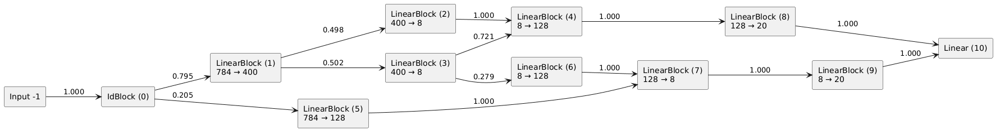

In [102]:
spearman_results = defaultdict(list)
kendall_results = defaultdict(list)

idx_experiment = 0
y_true = y_true_all[idx_experiment]

for i, (model_name, all_preds) in enumerate(preds_results.items()):
    if i > 2:
        break
    
    preds = all_preds[idx_experiment]

    spearman_results[model_name].append(spearmanr(preds, y_true)[0])
    kendall_results[model_name].append(kendalltau(preds, y_true)[0])
    

for i, (model_name, all_preds) in enumerate(list(preds_results.items())[3:]):
    preds = np.array(all_preds[idx_experiment])
    preds = preds.max() - preds

    spearman_results[model_name].append(spearmanr(preds, y_true)[0])
    kendall_results[model_name].append(kendalltau(preds, y_true)[0])\

for model_name, corr in spearman_results.items():
    print(f'{model_name},spearman\t{(sum(corr)):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

print('=' * 10)

for model_name, corr in kendall_results.items():
    print(f'{model_name},kendall\t{(sum(corr)):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

Graph,spearman	-0.309 $\pm$ nan
FCN,spearman	0.229 $\pm$ nan
Linear,spearman	-0.280 $\pm$ nan
L1,spearman	0.595 $\pm$ nan
Molchanov,spearman	0.192 $\pm$ nan
Graph,kendall	-0.261 $\pm$ nan
FCN,kendall	0.153 $\pm$ nan
Linear,kendall	-0.200 $\pm$ nan
L1,kendall	0.436 $\pm$ nan
Molchanov,kendall	0.135 $\pm$ nan


**Линейные и кроссы.**

In [103]:
class SurrogateModel(nn.Module):
    def __init__(self, edges: List[Tuple[int, int]]):
        super().__init__()

        self.edges = edges
        self.num_edges = len(edges)

        # Edge weights
        self.gamma = nn.Parameter(torch.zeros(self.num_edges))

        # Индексы: 0 - линейный (1-й порядок),1 - перекрестный (интерференция)
        self.poly_weights = nn.Parameter(torch.ones(2))
        # -----------------------------------------------------------------

        # Incoming and outgoing edges for each vertex
        incoming = defaultdict(list)
        outgoing = defaultdict(list)
        for idx, (u, v) in enumerate(edges):
            incoming[v].append(idx)
            outgoing[u].append(idx)
        self.incoming = dict(incoming)
        self.outgoing = dict(outgoing)

        # All vertices
        vertices = set()
        for u, v in edges:
            vertices.add(u)
            vertices.add(v)
        self.vertices = sorted(vertices)

        # Out vertex
        self.output_vertex = max(v for v in vertices if v >= 0)
    
    def normalized_edge_weights(self) -> torch.Tensor:
        """
        Returns: Tensor [E], >0 and sum of outgoing edges per vertex == 1
        """
        weights = torch.zeros_like(self.gamma)

        for _, edge_indices in self.outgoing.items():
            logits = self.gamma[edge_indices]
            weights[edge_indices] = torch.softmax(logits, dim=0)

        return weights

    def forward(self, edge_mask: torch.Tensor) -> torch.Tensor:
        """
        edge_mask: Tensor [B, num_edges], values in [0, 1]
        return: Tensor [B]
        """
        assert edge_mask.ndim == 2
        assert edge_mask.shape[1] == self.num_edges

        B = edge_mask.shape[0]
        device = edge_mask.device

        # Normalized edge weights
        edge_weights = self.normalized_edge_weights()  # [E]

        # values_1st: классическое прохождение сигнала
        # values_sq: прохождение квадратов сигнала (дисперсия путей)
        values_1st = {}
        values_sq = {}

        # Fixed input
        values_1st[-1] = torch.ones(B, device=device)
        values_sq[-1] = torch.ones(B, device=device)
        # ----------------------------------------------------------

        # Topological pass
        for v in self.vertices:
            if v == -1:
                continue

            incoming_edges = self.incoming.get(v, [])
            if not incoming_edges:
                values_1st[v] = torch.zeros(B, device=device)
                values_sq[v] = torch.zeros(B, device=device)
                continue

            total_1st = torch.zeros(B, device=device)
            total_sq = torch.zeros(B, device=device)

            for e_idx in incoming_edges:
                u, _ = self.edges[e_idx]
                
                # Совместное значение маски и веса ребра
                edge_val = edge_mask[:, e_idx] * edge_weights[e_idx]

                total_1st = total_1st + (edge_val * values_1st[u])
                total_sq = total_sq + ((edge_val ** 2) * values_sq[u])
                # -----------------------------------------------

            values_1st[v] = total_1st
            values_sq[v] = total_sq

        out_1st = values_1st[self.output_vertex]
        out_sq = values_sq[self.output_vertex]

        # Вычисляем перекрестные члены (коадаптацию параллельных веток)
        out_cross = (out_1st ** 2) - out_sq

        # Взвешиваем все два смысловых компонента
        w_lin, w_cross = self.poly_weights
        output = (w_lin * out_1st) + (w_cross * out_cross)
        # -------------------------------------------------------------

        return output

In [104]:
metric_results = defaultdict(list)
preds_results = defaultdict(list)
y_true_all = []

# Creating and train surrogate graph model
surrogate_graph_model = SurrogateModel(edges)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(surrogate_graph_model.parameters(), lr=config['lr_surrogate'])
surrogate_losses_history.append(train(surrogate_graph_model, surrogate_train_loader,
                                criterion, optimizer, config['device'],
                                config['n_epochs_surrogate'], 'Surrogate graph training', is_surrogate=True))

# Testing models
name2model = {
    'Graph': surrogate_graph_model,
    'FCN': surrogate_fcn_model,
    'Linear': surrogate_linear_model,
    'L1': importance_stats['l1'],
    'Molchanov': importance_stats['molchanov'],
}

name2metric, name2preds, y_true = test_models(name2model, surrogate_dataset_test, config['device'])
y_true_all.append(y_true)
for name_model in name2model:
    metric_results[name_model].append(name2metric[name_model])
    preds_results[name_model].append(name2preds[name_model])

Surrogate graph training:   0%|          | 0/3000 [00:00<?, ?it/s]

In [105]:
surrogate_graph_model.poly_weights

Parameter containing:
tensor([ 1.1620, -0.0230], device='cuda:0', requires_grad=True)

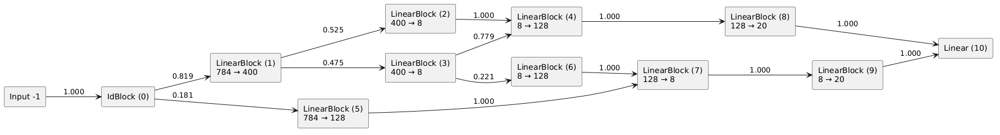

In [106]:
spearman_results = defaultdict(list)
kendall_results = defaultdict(list)

idx_experiment = 0
y_true = y_true_all[idx_experiment]

for i, (model_name, all_preds) in enumerate(preds_results.items()):
    if i > 2:
        break
    
    preds = all_preds[idx_experiment]

    spearman_results[model_name].append(spearmanr(preds, y_true)[0])
    kendall_results[model_name].append(kendalltau(preds, y_true)[0])
    

for i, (model_name, all_preds) in enumerate(list(preds_results.items())[3:]):
    preds = np.array(all_preds[idx_experiment])
    preds = preds.max() - preds

    spearman_results[model_name].append(spearmanr(preds, y_true)[0])
    kendall_results[model_name].append(kendalltau(preds, y_true)[0])\

for model_name, corr in spearman_results.items():
    print(f'{model_name},spearman\t{(sum(corr)):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

print('=' * 10)

for model_name, corr in kendall_results.items():
    print(f'{model_name},kendall\t{(sum(corr)):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

Graph,spearman	-0.309 $\pm$ nan
FCN,spearman	0.229 $\pm$ nan
Linear,spearman	-0.280 $\pm$ nan
L1,spearman	0.595 $\pm$ nan
Molchanov,spearman	0.192 $\pm$ nan
Graph,kendall	-0.261 $\pm$ nan
FCN,kendall	0.153 $\pm$ nan
Linear,kendall	-0.200 $\pm$ nan
L1,kendall	0.436 $\pm$ nan
Molchanov,kendall	0.135 $\pm$ nan


/home/pgn55555/venv/lib/python3.14/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/pgn55555/venv/lib/python3.14/site-packages/numpy/_core/_methods.py:211: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


**Линейные.**

In [107]:
class SurrogateModel(nn.Module):
    def __init__(self, edges: List[Tuple[int, int]]):
        super().__init__()

        self.edges = edges
        self.num_edges = len(edges)

        # Edge weights
        self.gamma = nn.Parameter(torch.zeros(self.num_edges))

        # self.bias = nn.Parameter(torch.tensor(0.0))

        # Incoming and outgoing edges for each vertex
        incoming = defaultdict(list)
        outgoing = defaultdict(list)
        for idx, (u, v) in enumerate(edges):
            incoming[v].append(idx)
            outgoing[u].append(idx)
        self.incoming = dict(incoming)
        self.outgoing = dict(outgoing)

        # All vertices
        vertices = set()
        for u, v in edges:
            vertices.add(u)
            vertices.add(v)
        self.vertices = sorted(vertices)

        # Out vertex
        self.output_vertex = max(v for v in vertices if v >= 0)
    
    def normalized_edge_weights(self) -> torch.Tensor:
        """
        Returns: Tensor [E], >0 and sum of outgoing edges per vertex == 1
        """
        weights = torch.zeros_like(self.gamma)

        for _, edge_indices in self.outgoing.items():
            logits = self.gamma[edge_indices]
            weights[edge_indices] = torch.softmax(logits, dim=0)

        return weights

    def forward(self, edge_mask: torch.Tensor) -> torch.Tensor:
        """
        edge_mask: Tensor [B, num_edges], values in [0, 1]
        return: Tensor [B]
        """
        assert edge_mask.ndim == 2
        assert edge_mask.shape[1] == self.num_edges

        B = edge_mask.shape[0]
        device = edge_mask.device

        # Normalized edge weights
        edge_weights = self.normalized_edge_weights()  # [E]

        # Values in vertices: vertex -> Tensor [B]
        values = {}

        # Fixed input
        values[-1] = torch.ones(B, device=device)

        # Topological pass
        for v in self.vertices:
            if v == -1:
                continue

            incoming_edges = self.incoming.get(v, [])
            if not incoming_edges:
                values[v] = torch.zeros(B, device=device)
                continue

            total = torch.zeros(B, device=device)
            for e_idx in incoming_edges:
                u, _ = self.edges[e_idx]
                total = total + (
                    edge_mask[:, e_idx]
                    * edge_weights[e_idx]
                    * values[u]
                )

            values[v] = total

        # Out in [0, 1]
        output = values[self.output_vertex] # + self.bias
        return output

In [108]:
metric_results = defaultdict(list)
preds_results = defaultdict(list)
y_true_all = []

# Creating and train surrogate graph model
surrogate_graph_model = SurrogateModel(edges)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(surrogate_graph_model.parameters(), lr=config['lr_surrogate'])
surrogate_losses_history.append(train(surrogate_graph_model, surrogate_train_loader,
                                criterion, optimizer, config['device'],
                                config['n_epochs_surrogate'], 'Surrogate graph training', is_surrogate=True))

# Testing models
name2model = {
    'Graph': surrogate_graph_model,
    'FCN': surrogate_fcn_model,
    'Linear': surrogate_linear_model,
    'L1': importance_stats['l1'],
    'Molchanov': importance_stats['molchanov'],
}

name2metric, name2preds, y_true = test_models(name2model, surrogate_dataset_test, config['device'])
y_true_all.append(y_true)
for name_model in name2model:
    metric_results[name_model].append(name2metric[name_model])
    preds_results[name_model].append(name2preds[name_model])

Surrogate graph training:   0%|          | 0/3000 [00:00<?, ?it/s]

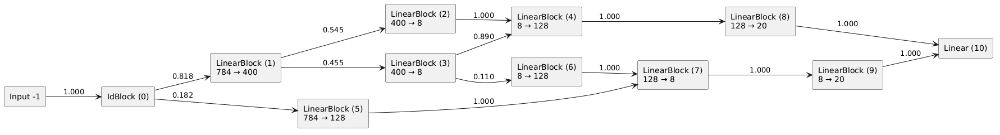

In [109]:
spearman_results = defaultdict(list)
kendall_results = defaultdict(list)

idx_experiment = 0
y_true = y_true_all[idx_experiment]

for i, (model_name, all_preds) in enumerate(preds_results.items()):
    if i > 2:
        break
    
    preds = all_preds[idx_experiment]

    spearman_results[model_name].append(spearmanr(preds, y_true)[0])
    kendall_results[model_name].append(kendalltau(preds, y_true)[0])
    

for i, (model_name, all_preds) in enumerate(list(preds_results.items())[3:]):
    preds = np.array(all_preds[idx_experiment])
    preds = preds.max() - preds

    spearman_results[model_name].append(spearmanr(preds, y_true)[0])
    kendall_results[model_name].append(kendalltau(preds, y_true)[0])\

for model_name, corr in spearman_results.items():
    print(f'{model_name},spearman\t{(sum(corr)):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

print('=' * 10)

for model_name, corr in kendall_results.items():
    print(f'{model_name},kendall\t{(sum(corr)):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

Graph,spearman	-0.309 $\pm$ nan
FCN,spearman	0.229 $\pm$ nan
Linear,spearman	-0.280 $\pm$ nan
L1,spearman	0.595 $\pm$ nan
Molchanov,spearman	0.192 $\pm$ nan
Graph,kendall	-0.261 $\pm$ nan
FCN,kendall	0.153 $\pm$ nan
Linear,kendall	-0.200 $\pm$ nan
L1,kendall	0.436 $\pm$ nan
Molchanov,kendall	0.135 $\pm$ nan


/home/pgn55555/venv/lib/python3.14/site-packages/numpy/_core/_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/pgn55555/venv/lib/python3.14/site-packages/numpy/_core/_methods.py:211: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Сохраним все результаты.

In [22]:
preds_results['Linear'] = np.array(preds_results['Linear']).tolist()

history_to_save = {
    "mnist_losses_history": mnist_losses_history,
    "surrogate_losses_history": surrogate_losses_history,
    "fcn_losses_history": fcn_losses_history,
    "metric_results": metric_results,
    "preds_results": preds_results,
    "y_true_all": np.array(y_true_all).tolist()
}

with open(f'histories/history_{config['n_iterations_graph']}_iterations.json', 'w') as json_file:
    json.dump(history_to_save, json_file)

SyntaxError: f-string: unmatched '[' (2836792763.py, line 12)

In [102]:
with open(f'histories/history_{config['n_iterations_graph']}_iterations.json', 'r') as json_file:
    history_to_save = json.loads(json_file.read())

mnist_losses_history = history_to_save["mnist_losses_history"]
surrogate_losses_history = history_to_save["surrogate_losses_history"]
fcn_losses_history = history_to_save["fcn_losses_history"]
metric_results = history_to_save["metric_results"]
preds_results = history_to_save["preds_results"]
y_true_all = history_to_save["y_true_all"]

Визуализируем графики обучения исходной модели.

Text(0.5, 0, 'Epoch')

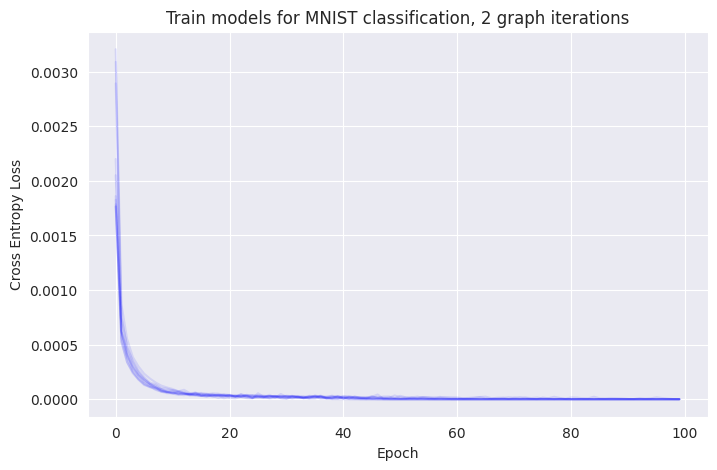

In [58]:
plt.figure(figsize=(8, 5))

for history in mnist_losses_history:
    plt.plot(history, alpha=0.1, color='blue')

plt.title(f'Train models for MNIST classification, {config['n_iterations_graph']} graph iterations')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')

Посмотрим на распределение итогового качества.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


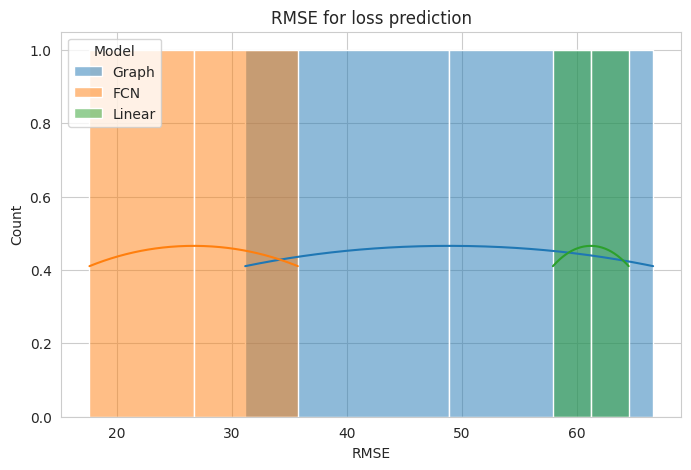

In [23]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(8, 5))

    for name_model, metric in metric_results.items():
        if name_model not in ('L1', 'Molchanov'):
            sns.histplot(metric, kde=True, alpha=0.5, label=name_model)

    plt.title('RMSE for loss prediction')
    plt.legend(title='Model')
    plt.xlabel('RMSE')

Посмотрим на усреднённое итоговое качество.

In [103]:
for model_name, metric in metric_results.items():
    if model_name not in ('L1', 'Molchanov'):
        print(f'{model_name}, RMSE\t{(sum(metric) / config['n_iterations_global']):.2f}%')

Graph, RMSE	49.23%
FCN, RMSE	36.93%
Linear, RMSE	62.50%


Посмотрим на корреляции.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


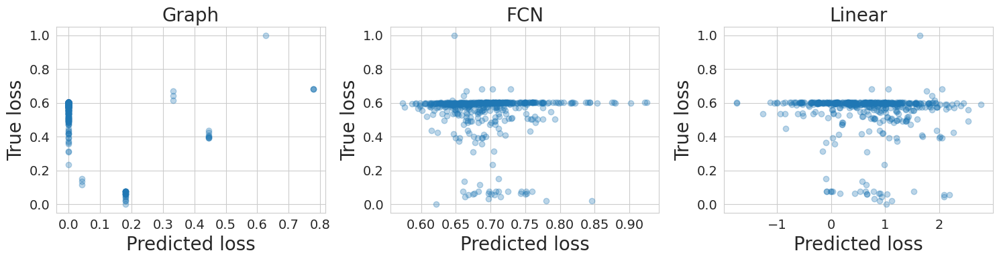

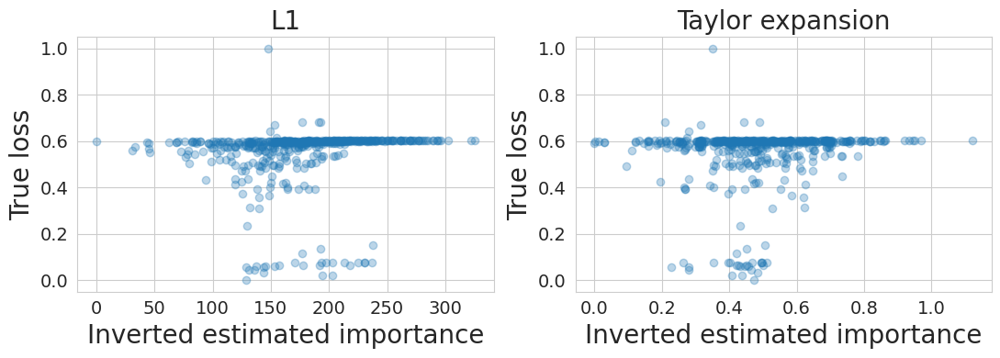

In [110]:
spearman_results = defaultdict(list)
kendall_results = defaultdict(list)

with sns.axes_style('whitegrid'):
    for idx_experiment in range(config['n_iterations_global']):
        plt.figure(figsize=(15, 4))

        y_true = y_true_all[idx_experiment]

        for i, (model_name, all_preds) in enumerate(preds_results.items()):
            if i > 2:
                break
            
            preds = all_preds[idx_experiment]

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 3, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Predicted loss', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name, fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()
            plt.savefig(
                f"histories/figs/graph_1_iter_{config['n_iterations_graph']}_experiment_{idx_experiment+1}.eps",
                format='eps')


        plt.figure(figsize=(11, 4))

        for i, (model_name, all_preds) in enumerate(list(preds_results.items())[3:]):
            preds = np.array(all_preds[idx_experiment])
            preds = preds.max() - preds

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 2, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Inverted estimated importance', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name if model_name != 'Molchanov' else 'Taylor expansion', fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()
            plt.savefig(
                f"histories/figs/graph_2_iter_{config['n_iterations_graph']}_experiment_{idx_experiment+1}.eps",
                format='eps')

In [105]:
for model_name, corr in spearman_results.items():
    print(f'{model_name},spearman\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

print('=' * 10)

for model_name, corr in kendall_results.items():
    print(f'{model_name},kendall\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

Graph,spearman	0.299 $\pm$ 0.235
FCN,spearman	-0.009 $\pm$ 0.213
Linear,spearman	0.060 $\pm$ 0.187
L1,spearman	0.547 $\pm$ 0.063
Molchanov,spearman	0.119 $\pm$ 0.247
Graph,kendall	0.253 $\pm$ 0.202
FCN,kendall	-0.011 $\pm$ 0.151
Linear,kendall	0.039 $\pm$ 0.135
L1,kendall	0.401 $\pm$ 0.057
Molchanov,kendall	0.094 $\pm$ 0.182


#### 20-40 рёбер

In [106]:
config['n_iterations_graph'] = 5

modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
len(edges)

Generating graphs:   0%|          | 0/5 [00:00<?, ?it/s]

30

In [ ]:
mnist_losses_history = []
surrogate_losses_history = []
fcn_losses_history = []
metric_results = defaultdict(list)
preds_results = defaultdict(list)
y_true_all = []

tbar = trange(config['n_iterations_global'], desc='Global iteration')
for i in tbar:
    update_log(i, 'global')
    
    # Sampling and creating graph model
    modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
    model = RandomGraphModel(modules, edges)

    # Training model
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=config['lr_mnist'])
    mnist_losses_history.append(train(model, train_loader, criterion, optimizer,
        config['device'], config['n_epochs_mnist'],
        'MNIST training', is_surrogate=False))

    # Creating a dataset for surrogate model
    surrogate_dataset_train, surrogate_dataset_test = create_surrogate_dataset(
        model, test_loader, nn.CrossEntropyLoss(),
        config['n_iterations_masks'], config['mask_prob'], config['device'])
    surrogate_train_loader = DataLoader(surrogate_dataset_train,
                                        batch_size=config['batch_size_surrogate'], shuffle=True)
    
    # Calculating L1 and Molchanov importances
    importance_stats = collect_model_stats(model, test_loader, criterion, optimizer, config['device'])

    # Creating and train surrogate graph model
    surrogate_graph_model = SurrogateModel(edges)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_graph_model.parameters(), lr=config['lr_surrogate'])
    surrogate_losses_history.append(train(surrogate_graph_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_surrogate'], 'Surrogate graph training', is_surrogate=True))

    # Creating and training surrogate FCN model (TODO: mismatch loss dim)
    surrogate_fcn_model = create_surrogate_fcn_model(len(edges), config['fcn_dims'], add_sigmoid=False)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_fcn_model.parameters(), lr=config['lr_fcn'])
    fcn_losses_history.append(train(surrogate_fcn_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_fcn'], 'Surrogate FCN training', is_surrogate=True))

    # Linear model
    surrogate_linear_model = LinearRegression()
    surrogate_linear_model.fit(
        surrogate_dataset_train.tensors[0].numpy(),
        surrogate_dataset_train.tensors[1].numpy()
        )

    # Testing models
    name2model = {
        'Graph': surrogate_graph_model,
        'FCN': surrogate_fcn_model,
        'Linear': surrogate_linear_model,
        'L1': importance_stats['l1'],
        'Molchanov': importance_stats['molchanov'],
    }
    
    name2metric, name2preds, y_true = test_models(name2model, surrogate_dataset_test, config['device'])
    y_true_all.append(y_true)
    for name_model in name2model:
        metric_results[name_model].append(name2metric[name_model])
        preds_results[name_model].append(name2preds[name_model])

Global iteration:   0%|          | 0/10 [00:00<?, ?it/s]

Generating graphs:   0%|          | 0/5 [00:00<?, ?it/s]

MNIST training:   0%|          | 0/100 [00:00<?, ?it/s]

Сохраним все результаты.

In [69]:
preds_results['Linear'] = np.array(preds_results['Linear']).tolist()

history_to_save = {
    "mnist_losses_history": mnist_losses_history,
    "surrogate_losses_history": surrogate_losses_history,
    "fcn_losses_history": fcn_losses_history,
    "metric_results": metric_results,
    "preds_results": preds_results,
    "y_true_all": np.array(y_true_all).tolist()
}

with open(f'histories/history_{config['n_iterations_graph']}_iterations.json', 'w') as json_file:
    json.dump(history_to_save, json_file)

In [107]:
with open(f'histories/history_{config['n_iterations_graph']}_iterations.json', 'r') as json_file:
    history_to_save = json.loads(json_file.read())

mnist_losses_history = history_to_save["mnist_losses_history"]
surrogate_losses_history = history_to_save["surrogate_losses_history"]
fcn_losses_history = history_to_save["fcn_losses_history"]
metric_results = history_to_save["metric_results"]
preds_results = history_to_save["preds_results"]
y_true_all = history_to_save["y_true_all"]

Визуализируем графики обучения исходной модели.

Text(0.5, 0, 'Epoch')

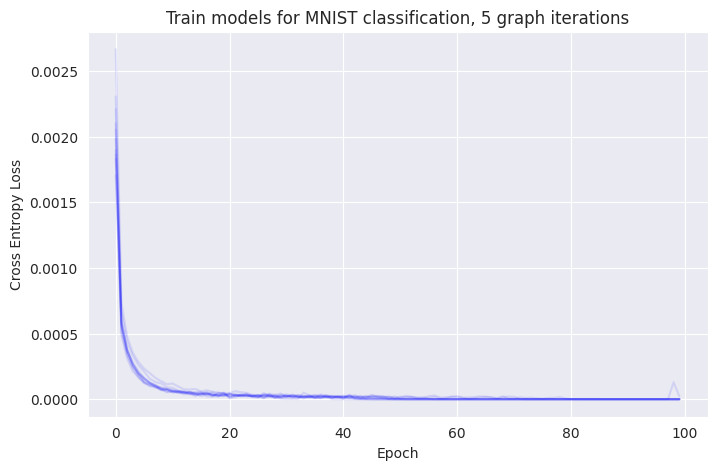

In [70]:
plt.figure(figsize=(8, 5))

for history in mnist_losses_history:
    plt.plot(history, alpha=0.1, color='blue')

plt.title(f'Train models for MNIST classification, {config['n_iterations_graph']} graph iterations')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')

Посмотрим на распределение итогового качества.

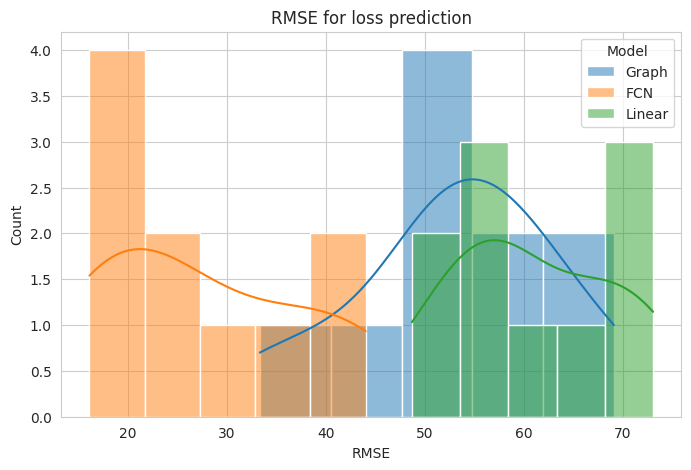

In [71]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(8, 5))

    for name_model, metric in metric_results.items():
        if name_model not in ('L1', 'Molchanov'):
            sns.histplot(metric, kde=True, alpha=0.5, label=name_model)

    plt.title('RMSE for loss prediction')
    plt.legend(title='Model')
    plt.xlabel('RMSE')

Посмотрим на усреднённое итоговое качество.

In [108]:
for model_name, metric in metric_results.items():
    if model_name not in ('L1', 'Molchanov'):
        print(f'{model_name}, RMSE\t{(sum(metric) / config['n_iterations_global']):.2f}%')

Graph, RMSE	53.04%
FCN, RMSE	27.82%
Linear, RMSE	61.03%


Посмотрим на корреляции.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

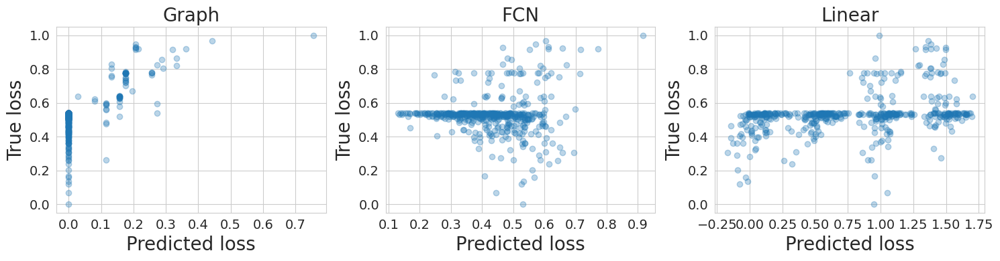

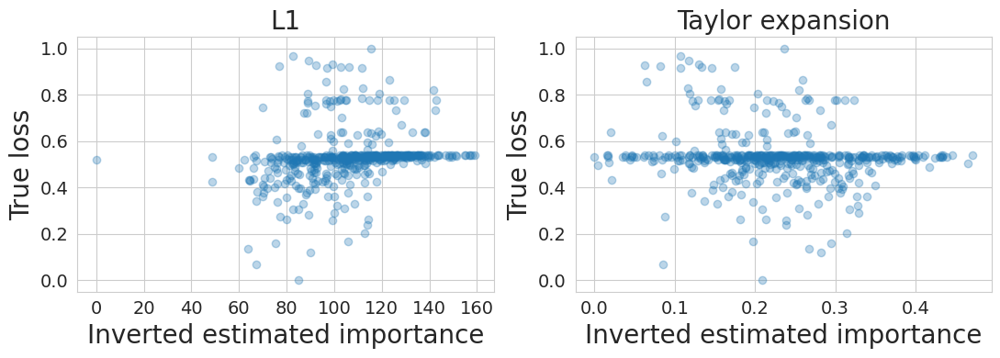

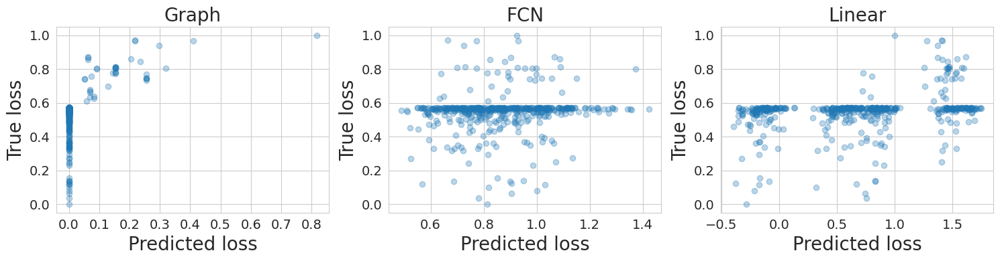

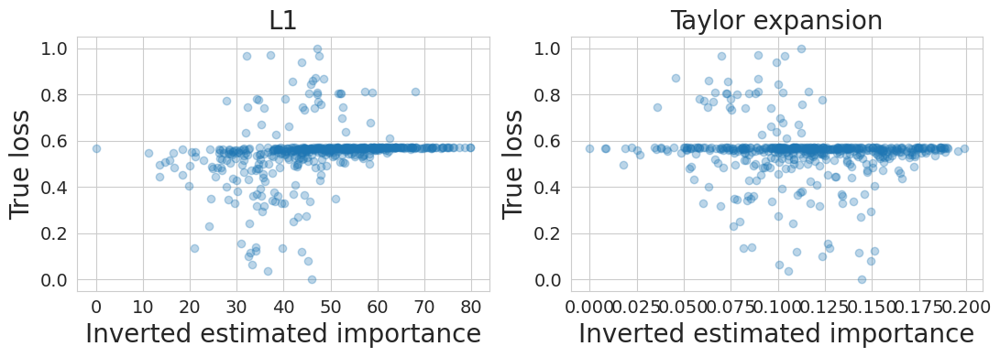

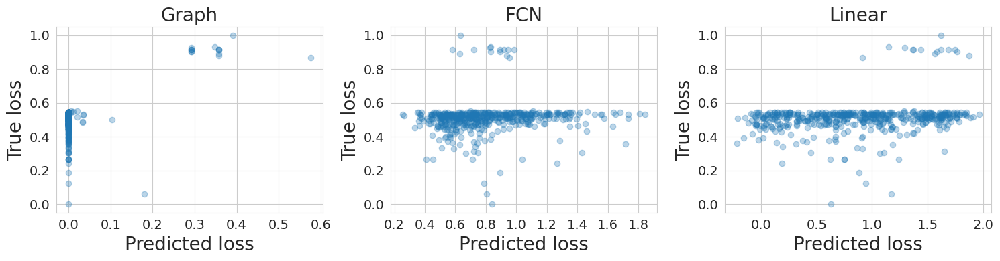

...

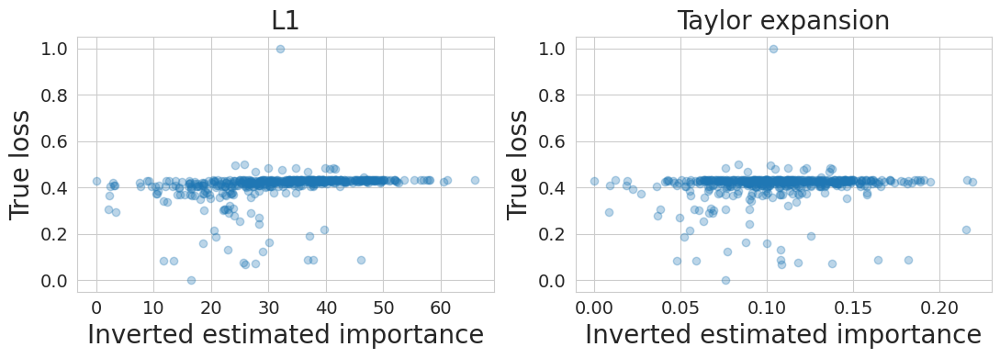

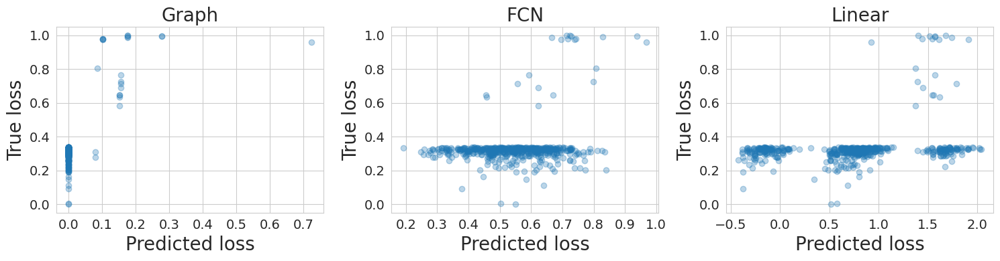

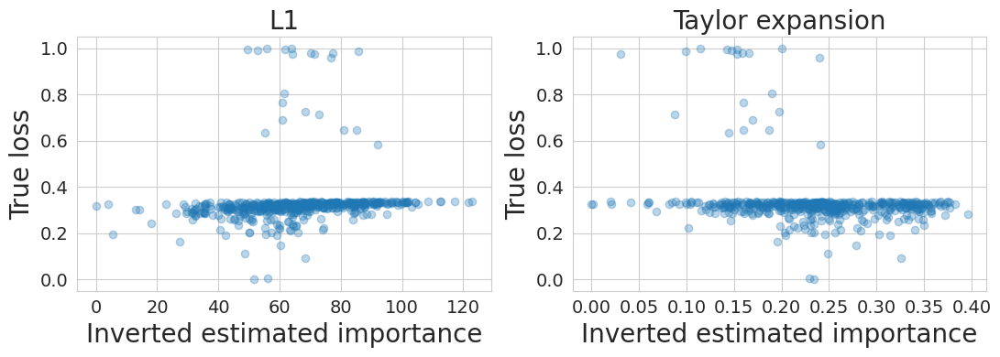

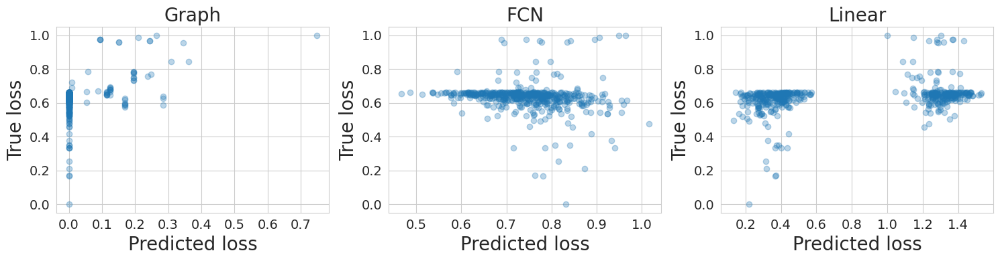

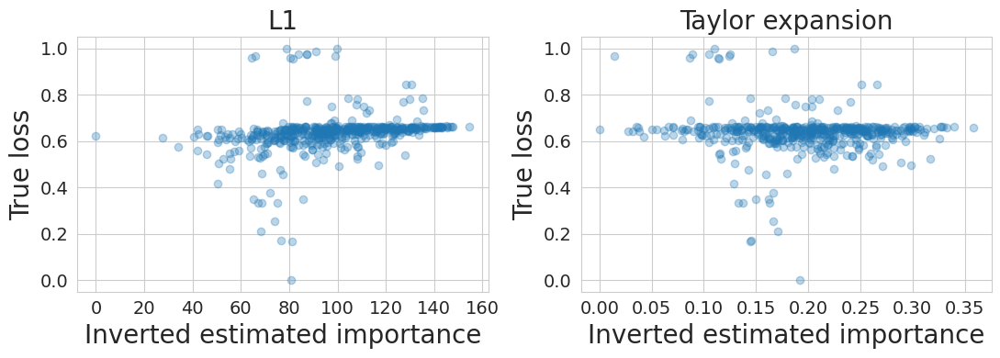

In [109]:
spearman_results = defaultdict(list)
kendall_results = defaultdict(list)

with sns.axes_style('whitegrid'):
    for idx_experiment in range(config['n_iterations_global']):
        plt.figure(figsize=(15, 4))

        y_true = y_true_all[idx_experiment]

        for i, (model_name, all_preds) in enumerate(preds_results.items()):
            if i > 2:
                break
            
            preds = all_preds[idx_experiment]

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 3, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Predicted loss', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name, fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()
            plt.savefig(
                f"histories/figs/graph_1_iter_{config['n_iterations_graph']}_experiment_{idx_experiment+1}.eps",
                format='eps')


        plt.figure(figsize=(11, 4))

        for i, (model_name, all_preds) in enumerate(list(preds_results.items())[3:]):
            preds = np.array(all_preds[idx_experiment])
            preds = preds.max() - preds

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 2, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Inverted estimated importance', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name if model_name != 'Molchanov' else 'Taylor expansion', fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()
            plt.savefig(
                f"histories/figs/graph_2_iter_{config['n_iterations_graph']}_experiment_{idx_experiment+1}.eps",
                format='eps')

In [110]:
for model_name, corr in spearman_results.items():
    print(f'{model_name},spearman\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

print('=' * 10)

for model_name, corr in kendall_results.items():
    print(f'{model_name},kendall\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

Graph,spearman	0.296 $\pm$ 0.178
FCN,spearman	-0.060 $\pm$ 0.187
Linear,spearman	0.201 $\pm$ 0.122
L1,spearman	0.505 $\pm$ 0.063
Molchanov,spearman	-0.052 $\pm$ 0.082
Graph,kendall	0.242 $\pm$ 0.146
FCN,kendall	-0.042 $\pm$ 0.128
Linear,kendall	0.137 $\pm$ 0.083
L1,kendall	0.353 $\pm$ 0.049
Molchanov,kendall	-0.033 $\pm$ 0.055


#### 50-100 рёбер

In [111]:
config['n_iterations_graph'] = 14

modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
len(edges)

Generating graphs:   0%|          | 0/14 [00:00<?, ?it/s]

74

In [ ]:
mnist_losses_history = []
surrogate_losses_history = []
fcn_losses_history = []
metric_results = defaultdict(list)
preds_results = defaultdict(list)
y_true_all = []

tbar = trange(config['n_iterations_global'], desc='Global iteration')
for i in tbar:
    update_log(i, 'global')
    
    # Sampling and creating graph model
    modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
    model = RandomGraphModel(modules, edges)

    # Training model
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=config['lr_mnist'])
    mnist_losses_history.append(train(model, train_loader, criterion, optimizer,
        config['device'], config['n_epochs_mnist'],
        'MNIST training', is_surrogate=False))

    # Creating a dataset for surrogate model
    surrogate_dataset_train, surrogate_dataset_test = create_surrogate_dataset(
        model, test_loader, nn.CrossEntropyLoss(),
        config['n_iterations_masks'], config['mask_prob'], config['device'])
    surrogate_train_loader = DataLoader(surrogate_dataset_train,
                                        batch_size=config['batch_size_surrogate'], shuffle=True)
    
    # Calculating L1 and Molchanov importances
    importance_stats = collect_model_stats(model, test_loader, criterion, optimizer, config['device'])

    # Creating and train surrogate graph model
    surrogate_graph_model = SurrogateModel(edges)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_graph_model.parameters(), lr=config['lr_surrogate'])
    surrogate_losses_history.append(train(surrogate_graph_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_surrogate'], 'Surrogate graph training', is_surrogate=True))

    # Creating and training surrogate FCN model (TODO: mismatch loss dim)
    surrogate_fcn_model = create_surrogate_fcn_model(len(edges), config['fcn_dims'], add_sigmoid=False)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_fcn_model.parameters(), lr=config['lr_fcn'])
    fcn_losses_history.append(train(surrogate_fcn_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_fcn'], 'Surrogate FCN training', is_surrogate=True))

    # Linear model
    surrogate_linear_model = LinearRegression()
    surrogate_linear_model.fit(
        surrogate_dataset_train.tensors[0].numpy(),
        surrogate_dataset_train.tensors[1].numpy()
        )

    # Testing models
    name2model = {
        'Graph': surrogate_graph_model,
        'FCN': surrogate_fcn_model,
        'Linear': surrogate_linear_model,
        'L1': importance_stats['l1'],
        'Molchanov': importance_stats['molchanov'],
    }
    
    name2metric, name2preds, y_true = test_models(name2model, surrogate_dataset_test, config['device'])
    y_true_all.append(y_true)
    for name_model in name2model:
        metric_results[name_model].append(name2metric[name_model])
        preds_results[name_model].append(name2preds[name_model])

Global iteration:   0%|          | 0/10 [00:00<?, ?it/s]

Generating graphs:   0%|          | 0/14 [00:00<?, ?it/s]

MNIST training:   0%|          | 0/100 [00:00<?, ?it/s]

Сохраним все результаты.

In [87]:
preds_results['Linear'] = np.array(preds_results['Linear']).tolist()

history_to_save = {
    "mnist_losses_history": mnist_losses_history,
    "surrogate_losses_history": surrogate_losses_history,
    "fcn_losses_history": fcn_losses_history,
    "metric_results": metric_results,
    "preds_results": preds_results,
    "y_true_all": np.array(y_true_all).tolist()
}

with open(f'histories/history_{config['n_iterations_graph']}_iterations.json', 'w') as json_file:
    json.dump(history_to_save, json_file)

In [112]:
with open(f'histories/history_{config['n_iterations_graph']}_iterations.json', 'r') as json_file:
    history_to_save = json.loads(json_file.read())

mnist_losses_history = history_to_save["mnist_losses_history"]
surrogate_losses_history = history_to_save["surrogate_losses_history"]
fcn_losses_history = history_to_save["fcn_losses_history"]
metric_results = history_to_save["metric_results"]
preds_results = history_to_save["preds_results"]
y_true_all = history_to_save["y_true_all"]

Визуализируем графики обучения исходной модели.

Text(0.5, 0, 'Epoch')

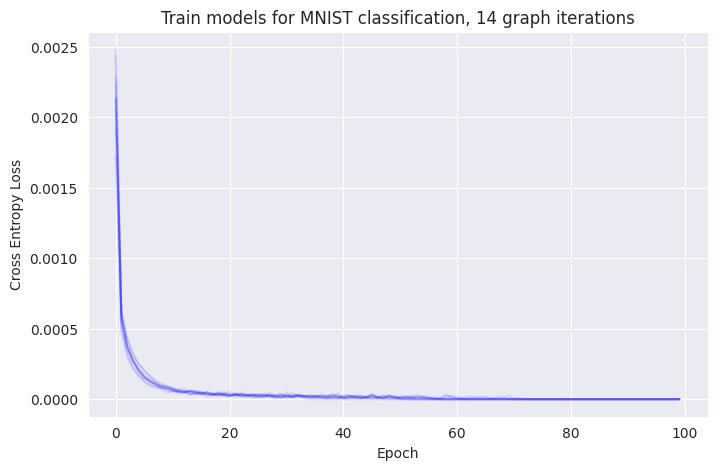

In [88]:
plt.figure(figsize=(8, 5))

for history in mnist_losses_history:
    plt.plot(history, alpha=0.1, color='blue')

plt.title(f'Train models for MNIST classification, {config['n_iterations_graph']} graph iterations')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')

Посмотрим на распределение итогового качества.

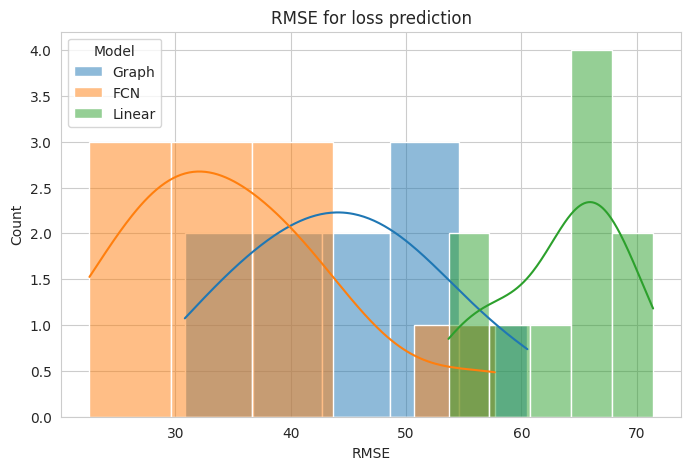

In [89]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(8, 5))

    for name_model, metric in metric_results.items():
        if name_model not in ('L1', 'Molchanov'):
            sns.histplot(metric, kde=True, alpha=0.5, label=name_model)

    plt.title('RMSE for loss prediction')
    plt.legend(title='Model')
    plt.xlabel('RMSE')

Посмотрим на усреднённое итоговое качество.

In [90]:
for model_name, metric in metric_results.items():
    if model_name not in ('L1', 'Molchanov'):
        print(f'{model_name}, RMSE\t{(sum(metric) / config['n_iterations_global']):.2f}%')

Graph, RMSE	44.53%
FCN, RMSE	35.46%
Linear, RMSE	63.52%


Посмотрим на корреляции.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

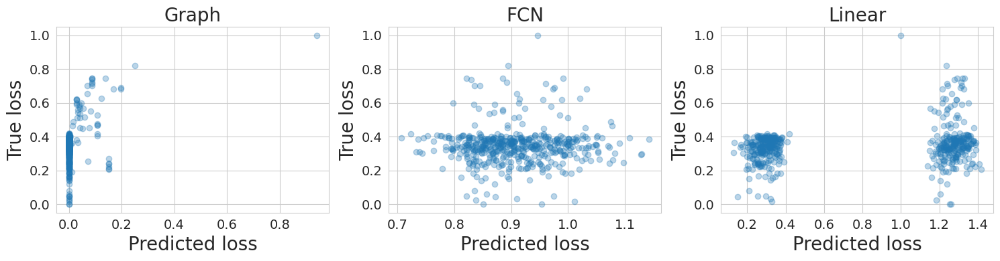

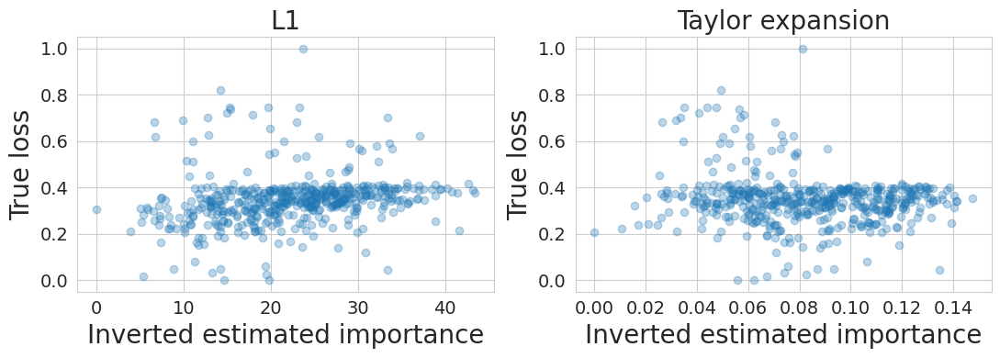

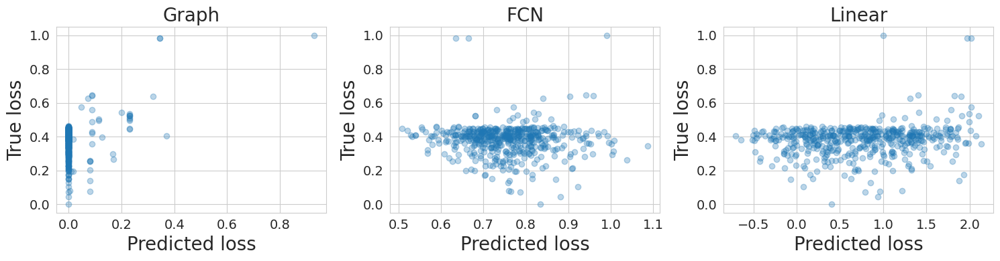

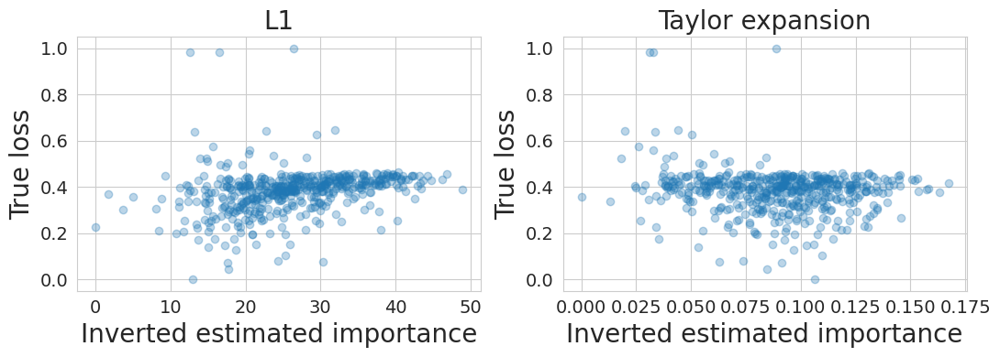

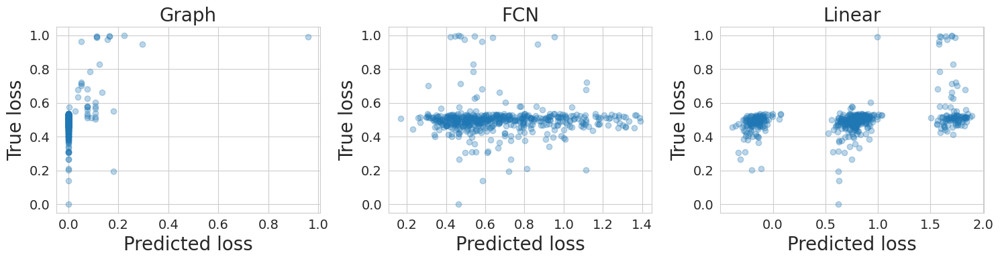

...

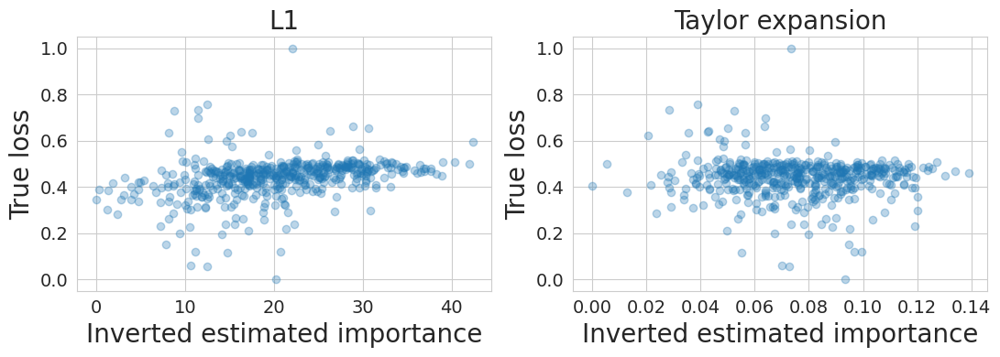

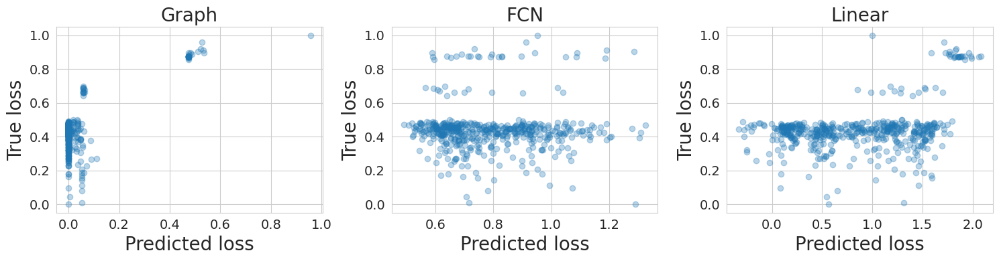

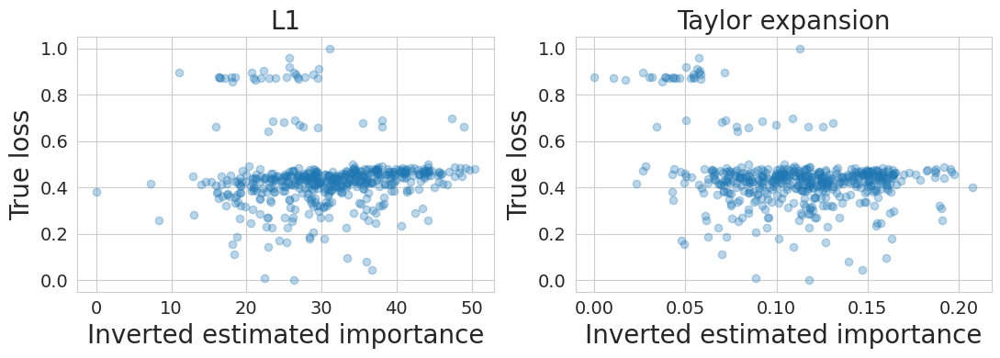

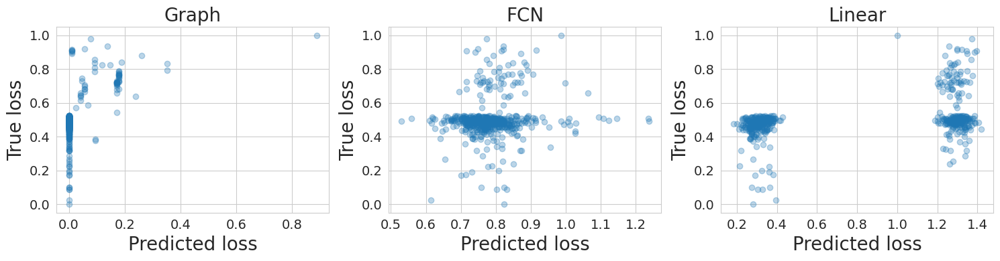

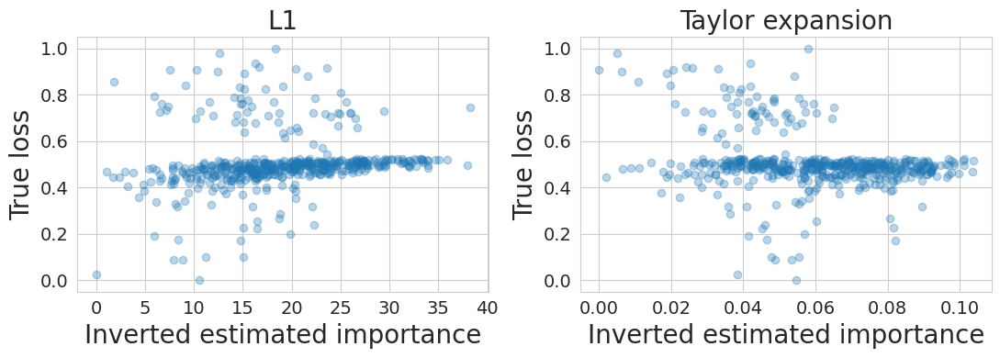

In [113]:
spearman_results = defaultdict(list)
kendall_results = defaultdict(list)

with sns.axes_style('whitegrid'):
    for idx_experiment in range(config['n_iterations_global']):
        plt.figure(figsize=(15, 4))

        y_true = y_true_all[idx_experiment]

        for i, (model_name, all_preds) in enumerate(preds_results.items()):
            if i > 2:
                break
            
            preds = all_preds[idx_experiment]

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 3, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Predicted loss', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name, fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()
            plt.savefig(
                f"histories/figs/graph_1_iter_{config['n_iterations_graph']}_experiment_{idx_experiment+1}.eps",
                format='eps')


        plt.figure(figsize=(11, 4))

        for i, (model_name, all_preds) in enumerate(list(preds_results.items())[3:]):
            preds = np.array(all_preds[idx_experiment])
            preds = preds.max() - preds

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 2, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Inverted estimated importance', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name if model_name != 'Molchanov' else 'Taylor expansion', fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()
            plt.savefig(
                f"histories/figs/graph_2_iter_{config['n_iterations_graph']}_experiment_{idx_experiment+1}.eps",
                format='eps')

In [114]:
for model_name, corr in spearman_results.items():
    print(f'{model_name},spearman\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

print('=' * 10)

for model_name, corr in kendall_results.items():
    print(f'{model_name},kendall\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

Graph,spearman	0.349 $\pm$ 0.128
FCN,spearman	-0.028 $\pm$ 0.090
Linear,spearman	0.248 $\pm$ 0.090
L1,spearman	0.369 $\pm$ 0.060
Molchanov,spearman	-0.136 $\pm$ 0.076
Graph,kendall	0.282 $\pm$ 0.105
FCN,kendall	-0.020 $\pm$ 0.061
Linear,kendall	0.167 $\pm$ 0.061
L1,kendall	0.259 $\pm$ 0.041
Molchanov,kendall	-0.090 $\pm$ 0.051


#### 100+ рёбер

In [115]:
config['n_iterations_graph'] = 30

modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
len(edges)

Generating graphs:   0%|          | 0/30 [00:00<?, ?it/s]

162

In [ ]:
mnist_losses_history = []
surrogate_losses_history = []
fcn_losses_history = []
metric_results = defaultdict(list)
preds_results = defaultdict(list)
y_true_all = []

tbar = trange(config['n_iterations_global'], desc='Global iteration')
for i in tbar:
    update_log(i, 'global')
    
    # Sampling and creating graph model
    modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
    model = RandomGraphModel(modules, edges)

    # Training model
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=config['lr_mnist'])
    mnist_losses_history.append(train(model, train_loader, criterion, optimizer,
        config['device'], config['n_epochs_mnist'],
        'MNIST training', is_surrogate=False))

    # Creating a dataset for surrogate model
    surrogate_dataset_train, surrogate_dataset_test = create_surrogate_dataset(
        model, test_loader, nn.CrossEntropyLoss(),
        config['n_iterations_masks'], config['mask_prob'], config['device'])
    surrogate_train_loader = DataLoader(surrogate_dataset_train,
                                        batch_size=config['batch_size_surrogate'], shuffle=True)
    
    # Calculating L1 and Molchanov importances
    importance_stats = collect_model_stats(model, test_loader, criterion, optimizer, config['device'])

    # Creating and train surrogate graph model
    surrogate_graph_model = SurrogateModel(edges)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_graph_model.parameters(), lr=config['lr_surrogate'])
    surrogate_losses_history.append(train(surrogate_graph_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_surrogate'], 'Surrogate graph training', is_surrogate=True))

    # Creating and training surrogate FCN model (TODO: mismatch loss dim)
    surrogate_fcn_model = create_surrogate_fcn_model(len(edges), config['fcn_dims'], add_sigmoid=False)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_fcn_model.parameters(), lr=config['lr_fcn'])
    fcn_losses_history.append(train(surrogate_fcn_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_fcn'], 'Surrogate FCN training', is_surrogate=True))

    # Linear model
    surrogate_linear_model = LinearRegression()
    surrogate_linear_model.fit(
        surrogate_dataset_train.tensors[0].numpy(),
        surrogate_dataset_train.tensors[1].numpy()
        )

    # Testing models
    name2model = {
        'Graph': surrogate_graph_model,
        'FCN': surrogate_fcn_model,
        'Linear': surrogate_linear_model,
        'L1': importance_stats['l1'],
        'Molchanov': importance_stats['molchanov'],
    }
    
    name2metric, name2preds, y_true = test_models(name2model, surrogate_dataset_test, config['device'])
    y_true_all.append(y_true)
    for name_model in name2model:
        metric_results[name_model].append(name2metric[name_model])
        preds_results[name_model].append(name2preds[name_model])

Global iteration:   0%|          | 0/10 [00:00<?, ?it/s]

Generating graphs:   0%|          | 0/30 [00:00<?, ?it/s]

MNIST training:   0%|          | 0/100 [00:00<?, ?it/s]

Сохраним все результаты.

In [95]:
preds_results['Linear'] = np.array(preds_results['Linear']).tolist()

history_to_save = {
    "mnist_losses_history": mnist_losses_history,
    "surrogate_losses_history": surrogate_losses_history,
    "fcn_losses_history": fcn_losses_history,
    "metric_results": metric_results,
    "preds_results": preds_results,
    "y_true_all": np.array(y_true_all).tolist()
}

with open(f'histories/history_{config['n_iterations_graph']}_iterations.json', 'w') as json_file:
    json.dump(history_to_save, json_file)

In [116]:
with open(f'histories/history_{config['n_iterations_graph']}_iterations.json', 'r') as json_file:
    history_to_save = json.loads(json_file.read())

mnist_losses_history = history_to_save["mnist_losses_history"]
surrogate_losses_history = history_to_save["surrogate_losses_history"]
fcn_losses_history = history_to_save["fcn_losses_history"]
metric_results = history_to_save["metric_results"]
preds_results = history_to_save["preds_results"]
y_true_all = history_to_save["y_true_all"]

Визуализируем графики обучения исходной модели.

Text(0.5, 0, 'Epoch')

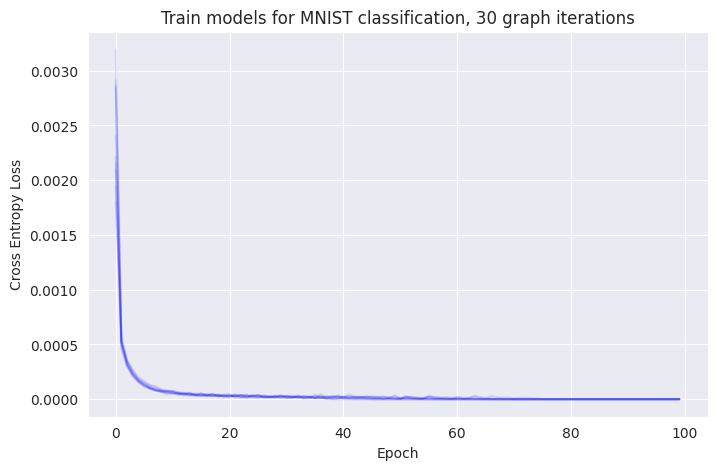

In [96]:
plt.figure(figsize=(8, 5))

for history in mnist_losses_history:
    plt.plot(history, alpha=0.1, color='blue')

plt.title(f'Train models for MNIST classification, {config['n_iterations_graph']} graph iterations')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')

Посмотрим на распределение итогового качества.

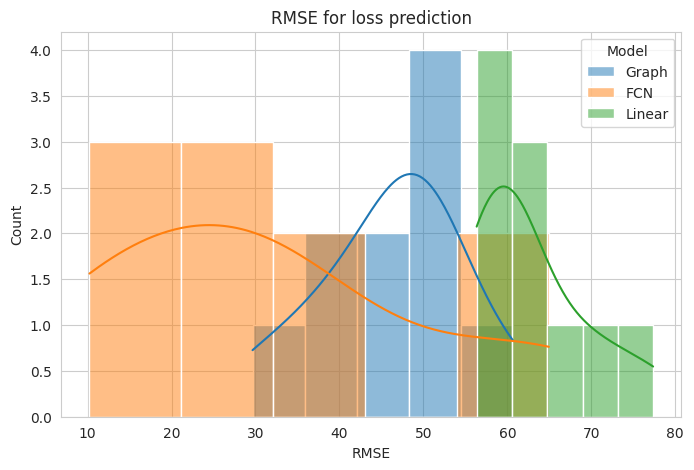

In [97]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(8, 5))

    for name_model, metric in metric_results.items():
        if name_model not in ('L1', 'Molchanov'):
            sns.histplot(metric, kde=True, alpha=0.5, label=name_model)

    plt.title('RMSE for loss prediction')
    plt.legend(title='Model')
    plt.xlabel('RMSE')

Посмотрим на усреднённое итоговое качество.

In [117]:
for model_name, metric in metric_results.items():
    if model_name not in ('L1', 'Molchanov'):
        print(f'{model_name}, RMSE\t{(sum(metric) / config['n_iterations_global']):.2f}%')

Graph, RMSE	46.14%
FCN, RMSE	31.50%
Linear, RMSE	62.97%


Посмотрим на корреляции.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

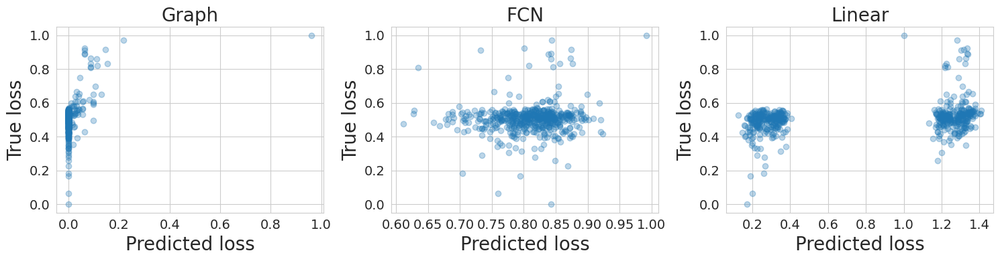

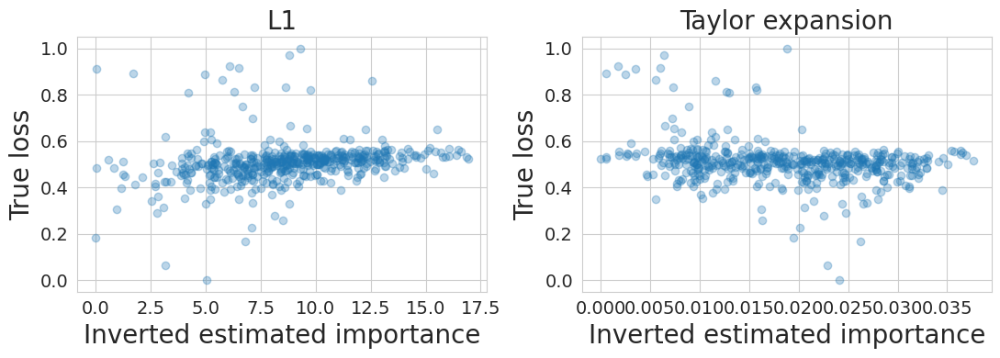

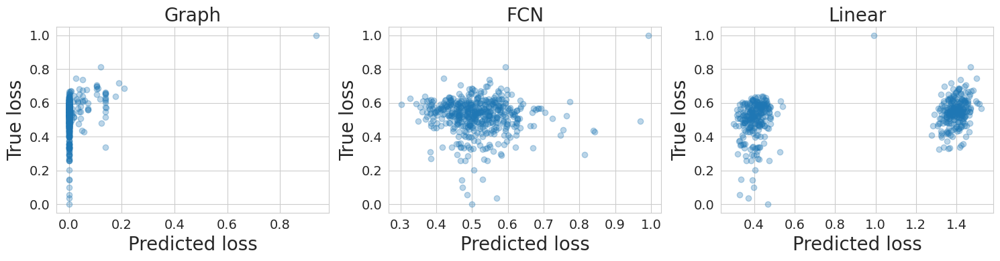

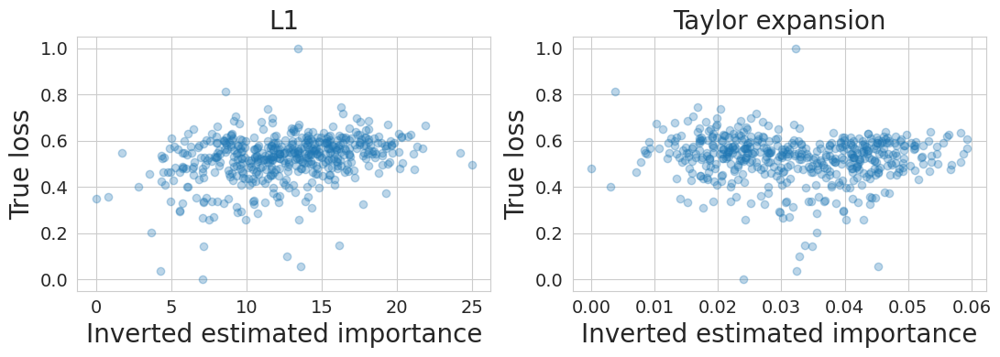

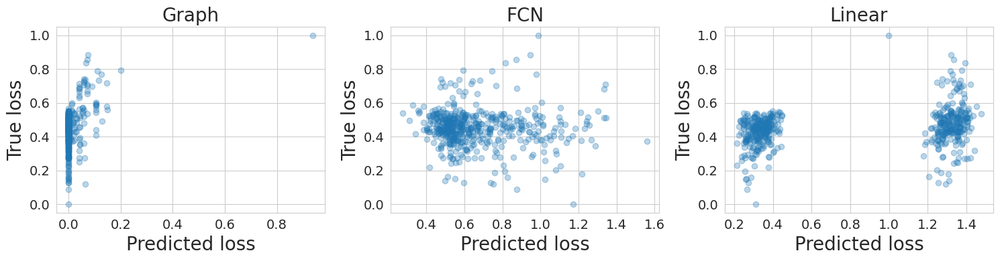

...

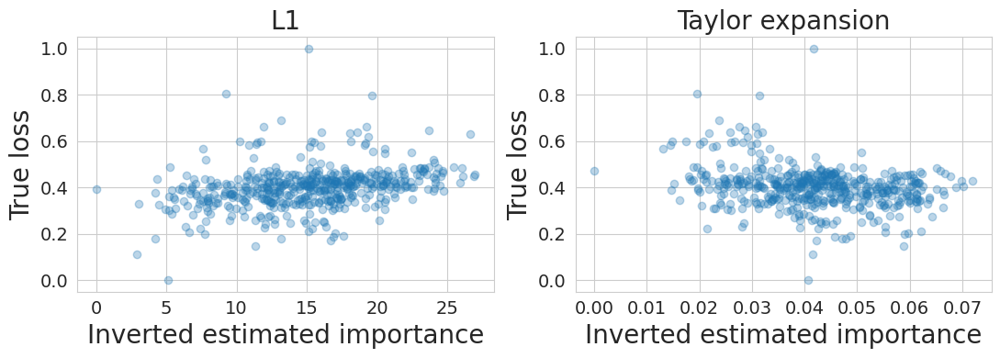

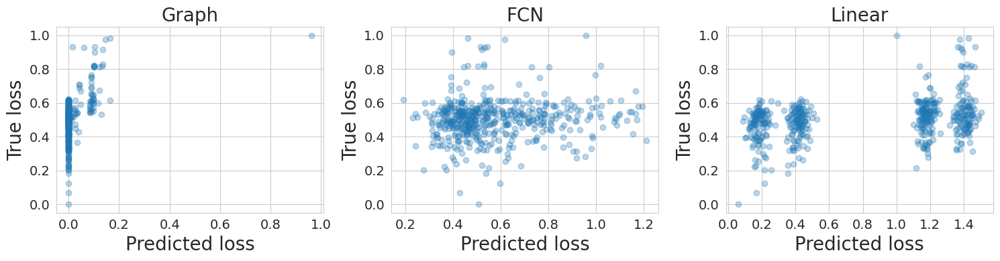

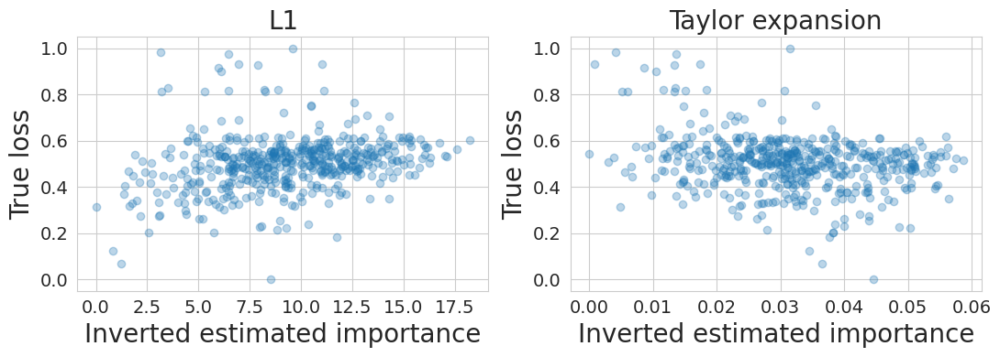

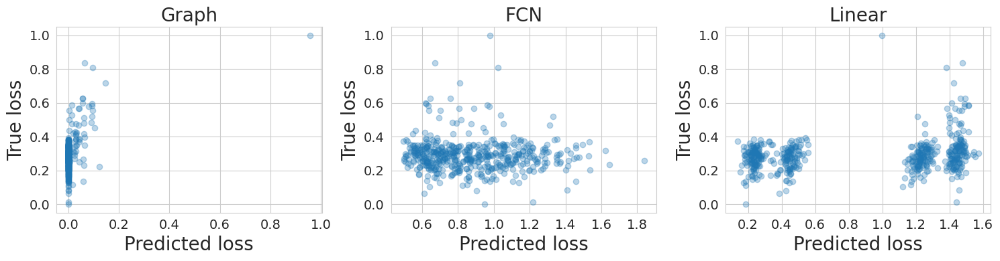

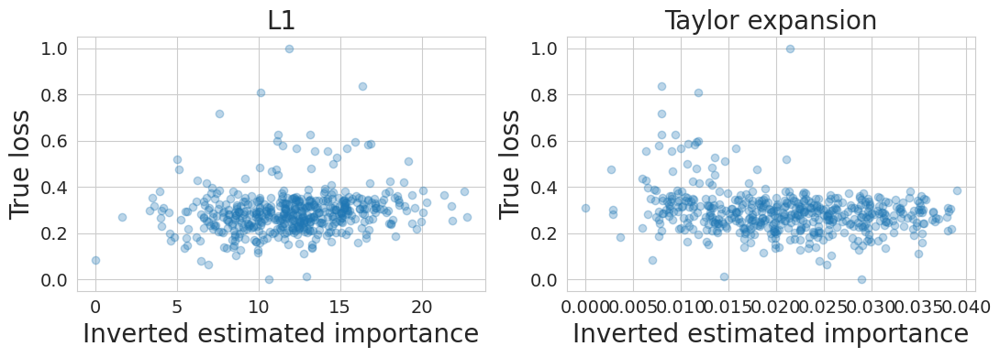

In [118]:
spearman_results = defaultdict(list)
kendall_results = defaultdict(list)

with sns.axes_style('whitegrid'):
    for idx_experiment in range(config['n_iterations_global']):
        plt.figure(figsize=(15, 4))

        y_true = y_true_all[idx_experiment]

        for i, (model_name, all_preds) in enumerate(preds_results.items()):
            if i > 2:
                break
            
            preds = all_preds[idx_experiment]

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 3, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Predicted loss', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name, fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()
            plt.savefig(
                f"histories/figs/graph_1_iter_{config['n_iterations_graph']}_experiment_{idx_experiment+1}.eps",
                format='eps')


        plt.figure(figsize=(11, 4))

        for i, (model_name, all_preds) in enumerate(list(preds_results.items())[3:]):
            preds = np.array(all_preds[idx_experiment])
            preds = preds.max() - preds

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 2, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Inverted estimated importance', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name if model_name != 'Molchanov' else 'Taylor expansion', fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()
            plt.savefig(
                f"histories/figs/graph_2_iter_{config['n_iterations_graph']}_experiment_{idx_experiment+1}.eps",
                format='eps')

In [119]:
for model_name, corr in spearman_results.items():
    print(f'{model_name},spearman\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

print('=' * 10)

for model_name, corr in kendall_results.items():
    print(f'{model_name},kendall\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

Graph,spearman	0.411 $\pm$ 0.057
FCN,spearman	-0.053 $\pm$ 0.099
Linear,spearman	0.294 $\pm$ 0.047
L1,spearman	0.280 $\pm$ 0.081
Molchanov,spearman	-0.204 $\pm$ 0.044
Graph,kendall	0.329 $\pm$ 0.045
FCN,kendall	-0.036 $\pm$ 0.066
Linear,kendall	0.199 $\pm$ 0.032
L1,kendall	0.192 $\pm$ 0.057
Molchanov,kendall	-0.136 $\pm$ 0.030


#### Top-K лучших моделей

Зададим множество рассматриваемых `n_iterations` и прочие переменные.

In [4]:
n_iterations_grid = [2, 5, 14, 30]
n_models = config['n_iterations_masks']

n_models_5 = int(n_models * 0.05)
n_models_10 = int(n_models * 0.1)

Напишем функцию для семплирования одинаковых значений.

In [5]:
def get_expected_intersection(y_true_top, preds, K):
    # Finding threshold
    threshold = np.partition(preds, -K)[-K]
    
    idx_greater = np.where(preds > threshold)[0]  # keep
    idx_equal = np.where(preds == threshold)[0]  # for sampling
    
    needed = K - len(idx_greater)
    
    # Intersects
    direct_intersect = np.intersect1d(y_true_top, idx_greater).shape[0]
    equal_intersect = np.intersect1d(y_true_top, idx_equal).shape[0]
    
    # Expected mean of intersects
    expected_intersect = direct_intersect + (equal_intersect * (needed / len(idx_equal)))
    
    return expected_intersect

Пройдёмся в цикле по этим значениям и посчитаем метрики.

In [6]:
results = {} 

for n_iterations in n_iterations_grid:
    results[n_iterations] = {m: [0.0, 0.0] for m in ['Graph', 'FCN', 'Linear', 'L1', 'Molchanov']}

    with open(f'histories/history_{n_iterations}_iterations.json', 'r') as json_file:
        history_to_save = json.loads(json_file.read())
    
    preds_results = history_to_save["preds_results"]
    y_true_all = history_to_save["y_true_all"]

    for idx_experiment in range(config['n_iterations_global']):
        true_vals = y_true_all[idx_experiment]
        true_loss_top5 = np.argsort(true_vals, stable=True)[-n_models_5:]
        true_loss_top10 = np.argsort(true_vals, stable=True)[-n_models_10:]

        for model_name, preds_list in preds_results.items():
            current_preds = np.array(preds_list[idx_experiment])

            exp_5 = get_expected_intersection(true_loss_top5, current_preds, n_models_5)
            exp_10 = get_expected_intersection(true_loss_top10, current_preds, n_models_10)

            results[n_iterations][model_name][0] += exp_5 / config['n_iterations_global']
            results[n_iterations][model_name][1] += exp_10 / config['n_iterations_global']

Выведем результат.

In [7]:
iterations2edges = {
    2: 15,
    5: 30,
    14: 75,
    30: 150
}

In [12]:
for n_iterations, result in results.items():
    result_df = pd.DataFrame(result).round(2).T
    result_df.columns = ['top-5', 'top-10']

    print(f'~{iterations2edges[n_iterations]} edges\n')
    print(result_df)
    print('\n' + '=' * 40 + '\n')

~15 edges

           top-5  top-10
Graph      15.49   27.65
FCN         0.50    3.70
Linear      4.70   11.30
L1          0.00    1.00
Molchanov   2.00    6.30


~30 edges

           top-5  top-10
Graph      16.13    27.4
FCN         3.80     8.3
Linear      2.40     7.5
L1          0.40     2.0
Molchanov   2.70     8.4


~75 edges

           top-5  top-10
Graph      17.33   33.69
FCN         1.30    6.20
Linear      6.80   14.30
L1          1.70    6.00
Molchanov   7.40   15.00


~150 edges

           top-5  top-10
Graph      14.58   33.46
FCN         1.70    5.70
Linear      3.80   12.90
L1          1.70    5.20
Molchanov   6.10   14.80




#### Примерно 20 рёбер, свёртки

In [32]:
config['n_iterations_graph'] = 3

modules, edges = generate_conv_graph(config['n_iterations_graph'])
len(edges)

Generating conv graph:   0%|          | 0/3 [00:00<?, ?it/s]

20

In [ ]:
mnist_losses_history = []
surrogate_losses_history = []
fcn_losses_history = []
metric_results = defaultdict(list)
preds_results = defaultdict(list)
y_true_all = []

tbar = trange(config['n_iterations_global'], desc='Global iteration')
for i in tbar:
    update_log(i, 'global')
    
    # Sampling and creating graph model
    modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
    model = RandomGraphModel(modules, edges)

    # Training model
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=config['lr_mnist'])
    mnist_losses_history.append(train(model, train_loader, criterion, optimizer,
        config['device'], config['n_epochs_mnist'],
        'MNIST training', is_surrogate=False))

    # Creating a dataset for surrogate model
    surrogate_dataset_train, surrogate_dataset_test = create_surrogate_dataset(
        model, test_loader, nn.CrossEntropyLoss(),
        config['n_iterations_masks'], config['mask_prob'], config['device'])
    surrogate_train_loader = DataLoader(surrogate_dataset_train,
                                        batch_size=config['batch_size_surrogate'], shuffle=True)
    
    # Calculating L1 and Molchanov importances
    importance_stats = collect_model_stats(model, test_loader, criterion, optimizer, config['device'])

    # Creating and train surrogate graph model
    surrogate_graph_model = SurrogateModel(edges)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_graph_model.parameters(), lr=config['lr_surrogate'])
    surrogate_losses_history.append(train(surrogate_graph_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_surrogate'], 'Surrogate graph training', is_surrogate=True))

    # Creating and training surrogate FCN model (TODO: mismatch loss dim)
    surrogate_fcn_model = create_surrogate_fcn_model(len(edges), config['fcn_dims'], add_sigmoid=False)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(surrogate_fcn_model.parameters(), lr=config['lr_fcn'])
    fcn_losses_history.append(train(surrogate_fcn_model, surrogate_train_loader,
                                    criterion, optimizer, config['device'],
                                    config['n_epochs_fcn'], 'Surrogate FCN training', is_surrogate=True))

    # Linear model
    surrogate_linear_model = LinearRegression()
    surrogate_linear_model.fit(
        surrogate_dataset_train.tensors[0].numpy(),
        surrogate_dataset_train.tensors[1].numpy()
        )

    # Testing models
    name2model = {
        'Graph': surrogate_graph_model,
        'FCN': surrogate_fcn_model,
        'Linear': surrogate_linear_model,
        'L1': importance_stats['l1'],
        'Molchanov': importance_stats['molchanov'],
    }
    
    name2metric, name2preds, y_true = test_models(name2model, surrogate_dataset_test, config['device'])
    y_true_all.append(y_true)
    for name_model in name2model:
        metric_results[name_model].append(name2metric[name_model])
        preds_results[name_model].append(name2preds[name_model])

Global iteration:   0%|          | 0/10 [00:00<?, ?it/s]

Generating graph:   0%|          | 0/3 [00:00<?, ?it/s]

MNIST training:   0%|          | 0/100 [00:00<?, ?it/s]

Визуализируем графики обучения исходной модели.

Text(0.5, 0, 'Epoch')

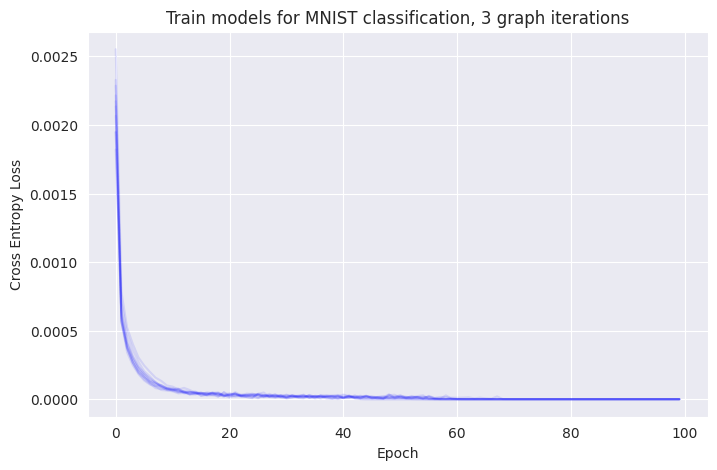

In [34]:
plt.figure(figsize=(8, 5))

for history in mnist_losses_history:
    plt.plot(history, alpha=0.1, color='blue')

plt.title(f'Train models for MNIST classification, {config['n_iterations_graph']} graph iterations')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')

Посмотрим на распределение итогового качества.

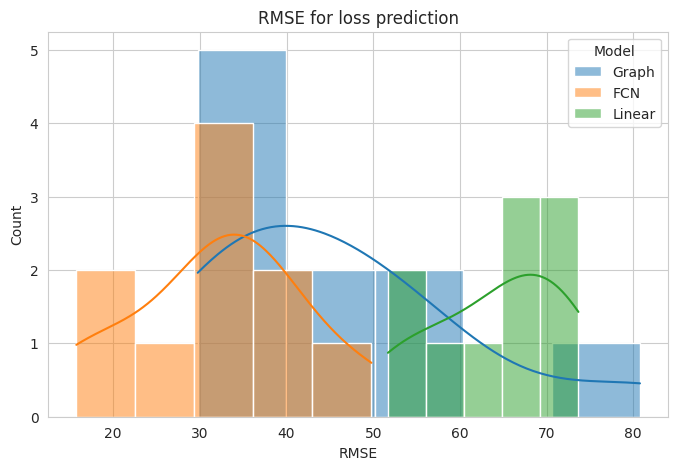

In [35]:
with sns.axes_style('whitegrid'):
    plt.figure(figsize=(8, 5))

    for name_model, metric in metric_results.items():
        if name_model not in ('L1', 'Molchanov'):
            sns.histplot(metric, kde=True, alpha=0.5, label=name_model)

    plt.title('RMSE for loss prediction')
    plt.legend(title='Model')
    plt.xlabel('RMSE')

Посмотрим на усреднённое итоговое качество.

In [36]:
for model_name, metric in metric_results.items():
    if model_name not in ('L1', 'Molchanov'):
        print(f'{model_name}, RMSE\t{(sum(metric) / config['n_iterations_global']):.2f}%')

Graph, RMSE	45.87%
FCN, RMSE	32.15%
Linear, RMSE	64.31%


Посмотрим на корреляции.

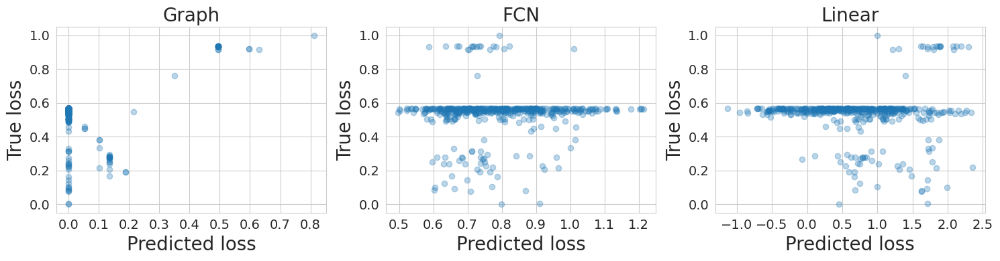

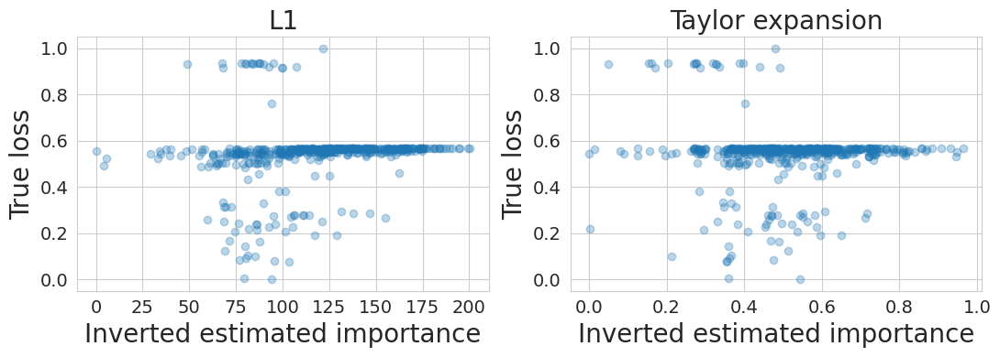

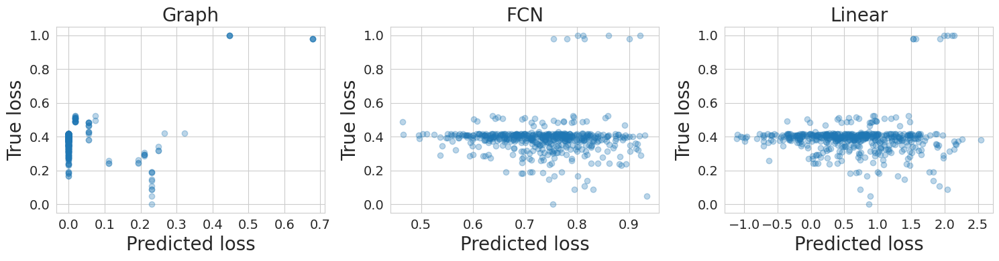

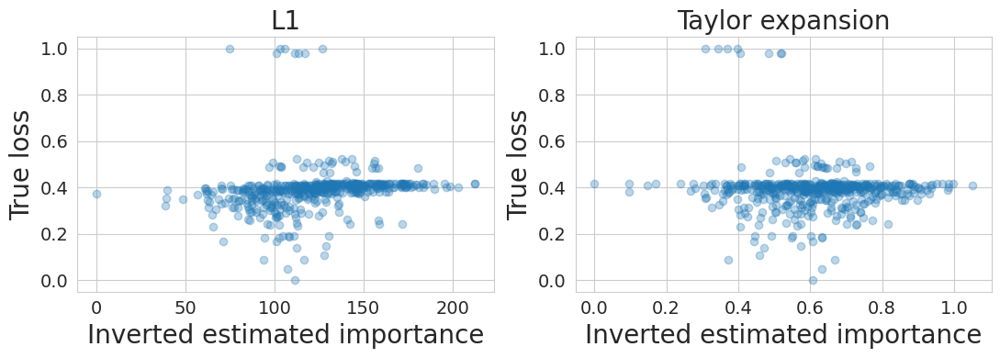

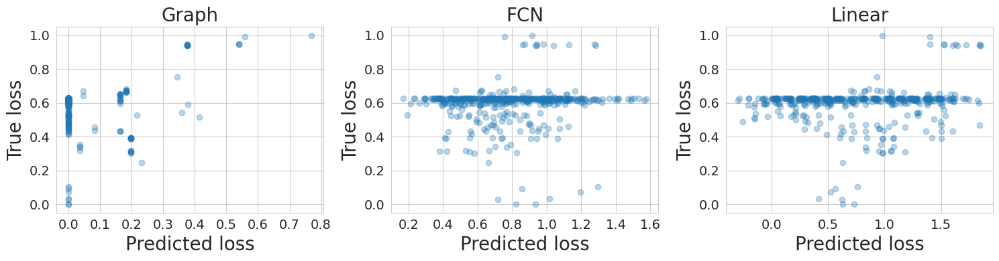

...

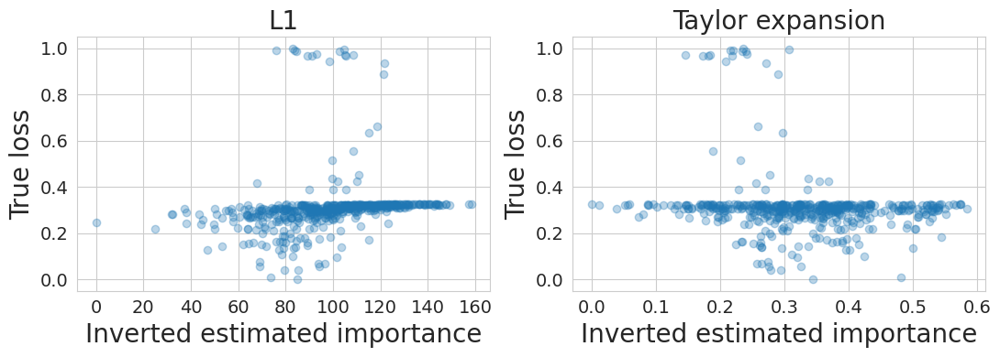

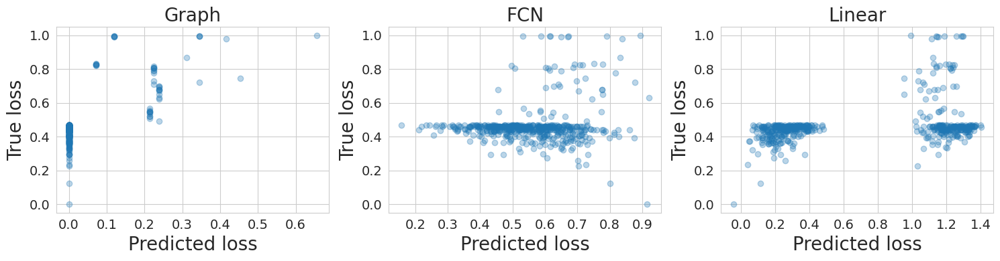

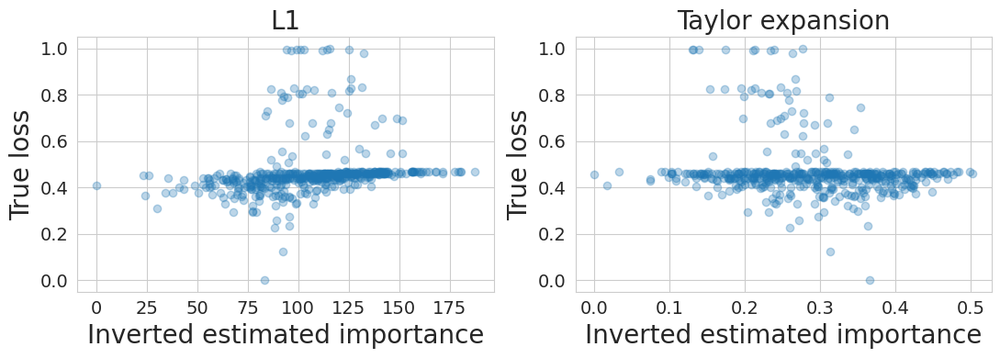

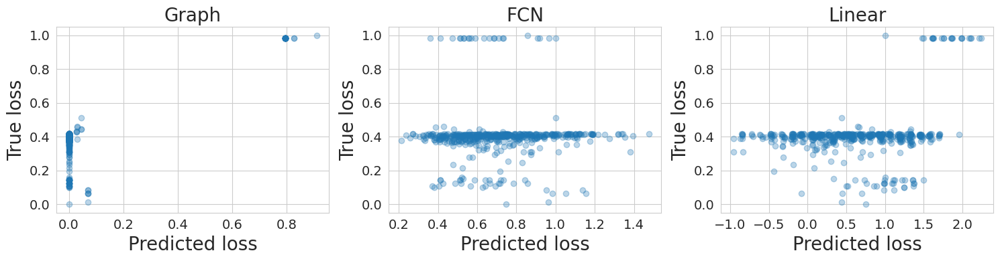

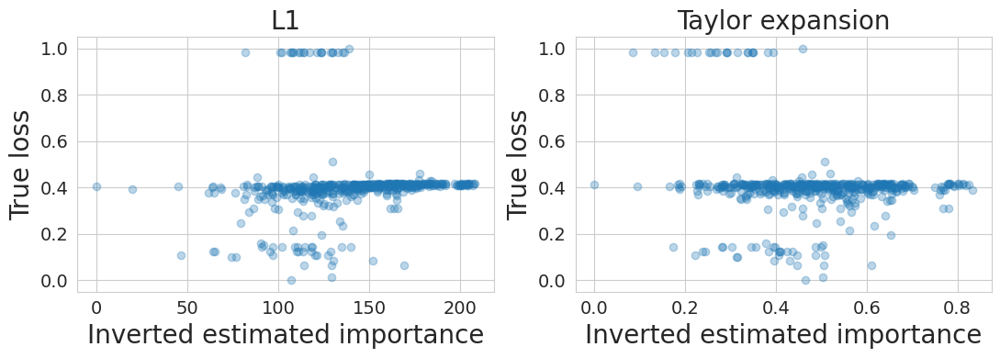

In [37]:
spearman_results = defaultdict(list)
kendall_results = defaultdict(list)

with sns.axes_style('whitegrid'):
    for idx_experiment in range(config['n_iterations_global']):
        plt.figure(figsize=(15, 4))

        y_true = y_true_all[idx_experiment]

        for i, (model_name, all_preds) in enumerate(preds_results.items()):
            if i > 2:
                break
            
            preds = all_preds[idx_experiment]

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 3, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Predicted loss', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name, fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()

        plt.figure(figsize=(11, 4))

        for i, (model_name, all_preds) in enumerate(list(preds_results.items())[3:]):
            preds = np.array(all_preds[idx_experiment])
            preds = preds.max() - preds

            spearman_results[model_name].append(spearmanr(preds, y_true)[0])
            kendall_results[model_name].append(kendalltau(preds, y_true)[0])
            
            plt.subplot(1, 2, i+1)
            plt.scatter(preds, y_true, alpha=0.3)
            plt.xlabel('Inverted estimated importance', fontsize=20)
            plt.ylabel('True loss', fontsize=20)
            plt.title(model_name if model_name != 'Molchanov' else 'Taylor expansion', fontsize=20)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)

            plt.tight_layout()

In [38]:
for model_name, corr in spearman_results.items():
    print(f'{model_name},spearman\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

print('=' * 10)

for model_name, corr in kendall_results.items():
    print(f'{model_name},kendall\t{(sum(corr) / config['n_iterations_global']):.3f} $\\pm$ {np.std(corr, ddof=1):.3f}')

Graph,spearman	0.202 $\pm$ 0.238
FCN,spearman	-0.067 $\pm$ 0.147
Linear,spearman	0.015 $\pm$ 0.187
L1,spearman	0.547 $\pm$ 0.102
Molchanov,spearman	0.021 $\pm$ 0.138
Graph,kendall	0.169 $\pm$ 0.199
FCN,kendall	-0.048 $\pm$ 0.102
Linear,kendall	0.009 $\pm$ 0.132
L1,kendall	0.394 $\pm$ 0.082
Molchanov,kendall	0.018 $\pm$ 0.098


#### График всех корреляций

In [1]:
n_edges = [15, 30, 75, 150]

graph_spearman = [0.299, 0.296, 0.349, 0.411]
fcn_spearman = [-0.009, -0.060, -0.028, -0.053]
linear_spearman = [0.060, 0.201, 0.248, 0.294]
l1_spearman = [0.547, 0.505, 0.369, 0.280]
molchanov_spearman = [0.119, -0.052, -0.136, -0.204]

graph_spearman_std = [0.235, 0.178, 0.128, 0.057]
fcn_spearman_std = [0.213, 0.187, 0.090, 0.099]
linear_spearman_std = [0.187, 0.122, 0.090, 0.047]
l1_spearman_std = [0.063, 0.063, 0.060, 0.081]
molchanov_spearman_std = [0.247, 0.082, 0.076, 0.044]

graph_kendall = [0.253, 0.242, 0.282, 0.329]
fcn_kendall = [-0.011, -0.042, -0.020, -0.036]
linear_kendall = [0.039, 0.137, 0.167, 0.199]
l1_kendall = [0.401, 0.353, 0.259, 0.192]
molchanov_kendall = [0.094, -0.033, -0.090, -0.136]

graph_kendall_std = [0.202, 0.146, 0.105, 0.045]
fcn_kendall_std = [0.151, 0.128, 0.061, 0.066]
linear_kendall_std = [0.135, 0.083, 0.061, 0.032]
l1_kendall_std = [0.057, 0.049, 0.041, 0.057]
molchanov_kendall_std = [0.182, 0.055, 0.051, 0.030]

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

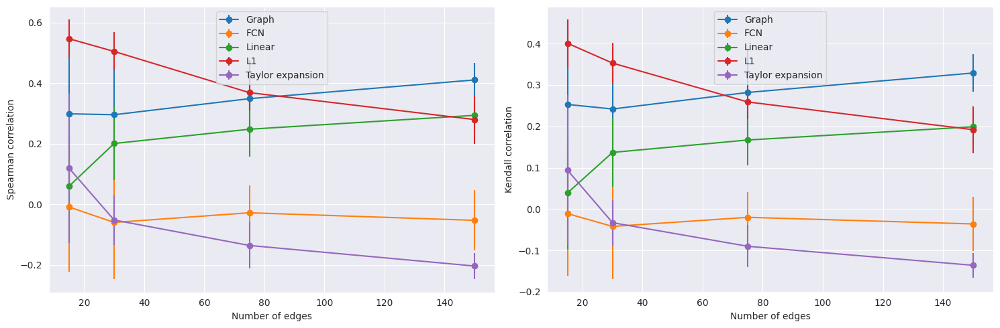

In [3]:
plt.figure(figsize=(15, 5))

# Spearman
plt.subplot(1,2,1)
plt.errorbar(n_edges, graph_spearman, yerr=graph_spearman_std, marker='o', label='Graph')
plt.errorbar(n_edges, fcn_spearman, yerr=fcn_spearman_std, marker='o', label='FCN')
plt.errorbar(n_edges, linear_spearman, yerr=linear_spearman_std, marker='o', label='Linear')
plt.errorbar(n_edges, l1_spearman, yerr=l1_spearman_std, marker='o', label='L1')
plt.errorbar(n_edges, molchanov_spearman, yerr=molchanov_spearman_std, marker='o', label='Taylor expansion')

plt.xlabel("Number of edges")
plt.ylabel("Spearman correlation")
plt.legend()
plt.grid(True)

# Kendall
plt.subplot(1,2,2)
plt.errorbar(n_edges, graph_kendall, yerr=graph_kendall_std, marker='o', label='Graph')
plt.errorbar(n_edges, fcn_kendall, yerr=fcn_kendall_std, marker='o', label='FCN')
plt.errorbar(n_edges, linear_kendall, yerr=linear_kendall_std, marker='o', label='Linear')
plt.errorbar(n_edges, l1_kendall, yerr=l1_kendall_std, marker='o', label='L1')
plt.errorbar(n_edges, molchanov_kendall, yerr=molchanov_kendall_std, marker='o', label='Taylor expansion')

plt.xlabel("Number of edges")
plt.ylabel("Kendall correlation")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


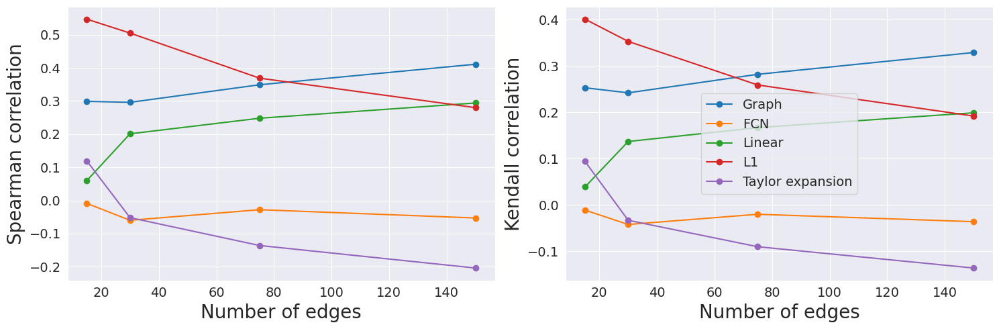

In [4]:
plt.figure(figsize=(15,5))

# Spearman
plt.subplot(1,2,1)

plt.plot(n_edges, graph_spearman, label="Graph", marker='o')
plt.plot(n_edges, fcn_spearman, label="FCN", marker='o')
plt.plot(n_edges, linear_spearman, label="Linear", marker='o')
plt.plot(n_edges, l1_spearman, label="L1", marker='o')
plt.plot(n_edges, molchanov_spearman, label="Taylor expansion", marker='o')

plt.xlabel("Number of edges", fontsize=20)
plt.ylabel("Spearman correlation", fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


# Kendall
plt.subplot(1,2,2)

plt.plot(n_edges, graph_kendall, label="Graph", marker='o')
plt.plot(n_edges, fcn_kendall, label="FCN", marker='o')
plt.plot(n_edges, linear_kendall, label="Linear", marker='o')
plt.plot(n_edges, l1_kendall, label="L1", marker='o')
plt.plot(n_edges, molchanov_kendall, label="Taylor expansion", marker='o')

plt.xlabel("Number of edges", fontsize=20)
plt.ylabel("Kendall correlation", fontsize=20)
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.legend(fontsize=14)

plt.tight_layout()

plt.savefig(
            f"histories/figs/final_plot.eps",
            format='eps')


### Рисуем графы

In [ ]:
config['n_iterations_graph'] = 2

modules, edges = generate_graph(
        config['input_dim'],
        config['n_iterations_graph'])
len(edges)

In [29]:
config['n_iterations_graph'] = 3

modules, edges = generate_conv_graph(config['n_iterations_graph'])
len(edges)

Generating conv graph:   0%|          | 0/3 [00:00<?, ?it/s]

20

In [85]:
def export_to_uml(modules, edges, gamma_values):
    """
    Generate PlantUML component diagram from (modules, edges).
    gamma_values: array-like [E] — значения весов рёбер
    """
    lines = []
    lines.append("@startuml")
    lines.append("skinparam componentStyle rectangle")
    lines.append("left to right direction")
    lines.append("")

    # --- Input node ---
    lines.append('component "Input -1" as N_minus1')

    # --- Modules ---
    for idx, module in enumerate(modules):

        if hasattr(module, "linear"):
            label = (
                f"LinearBlock ({idx})\\n"
                f"{module.linear.in_features} → {module.linear.out_features}"
            )
        elif module.__class__.__name__ == "IdBlock":
            label = f"IdBlock (0)"
        else:
            label = f"{type(module).__name__} ({idx})"

        lines.append(f'component "{label}" as N_{idx}')

    lines.append("")

    # --- Edges WITH gamma ---
    for e_idx, (i, j) in enumerate(edges):
        src = "N_minus1" if i == -1 else f"N_{i}"
        dst = f"N_{j}"

        gamma_val = float(gamma_values[e_idx])
        gamma_str = f"{gamma_val:.3f}"

        lines.append(f"{src} --> {dst} : {gamma_str}")

    lines.append("")
    lines.append("@enduml")

    return "\n".join(lines)

In [95]:
gamma = surrogate_graph_model.normalized_edge_weights().detach().cpu().numpy()
uml = export_to_uml(modules, edges, gamma)
print(uml)

@startuml
skinparam componentStyle rectangle
left to right direction

component "Input -1" as N_minus1
component "IdBlock (0)" as N_0
component "LinearBlock (1)\n784 → 400" as N_1
component "LinearBlock (2)\n400 → 8" as N_2
component "LinearBlock (3)\n400 → 8" as N_3
component "LinearBlock (4)\n8 → 128" as N_4
component "LinearBlock (5)\n784 → 128" as N_5
component "LinearBlock (6)\n8 → 128" as N_6
component "LinearBlock (7)\n128 → 8" as N_7
component "LinearBlock (8)\n128 → 20" as N_8
component "LinearBlock (9)\n8 → 20" as N_9
component "Linear (10)" as N_10

N_minus1 --> N_0 : 1.000
N_0 --> N_1 : 0.818
N_1 --> N_2 : 0.545
N_1 --> N_3 : 0.455
N_3 --> N_4 : 0.890
N_2 --> N_4 : 1.000
N_0 --> N_5 : 0.182
N_3 --> N_6 : 0.110
N_6 --> N_7 : 1.000
N_5 --> N_7 : 1.000
N_4 --> N_8 : 1.000
N_7 --> N_9 : 1.000
N_8 --> N_10 : 1.000
N_9 --> N_10 : 1.000

@enduml
